# Assignment 1-B Polynomial Regression and Regularization

##### Multivariate Polynomial Regression is a powerful technique used in machine learning and statistics to model relationships between multiple independent variables and a dependent variable.

### Importing the Libraries

In [1]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import random
from sklearn.metrics import r2_score
import math
import itertools



### Loading the Dataset and Preprocessing

In [2]:
df = pd.read_csv("./Fish Data - A2.csv")

In [3]:
df

,Height,Width,Weight
0,11.5200,4.0200,242.0
1,12.4800,4.3056,290.0
2,12.3778,4.6961,340.0
3,12.7300,4.4555,363.0
4,12.4440,5.1340,430.0
...,...,...,...
154,2.0904,1.3936,12.2
155,2.4300,1.2690,13.4
156,2.2770,1.2558,12.2
157,2.8728,2.0672,19.7


In [4]:
df.head()

,Height,Width,Weight
0,11.5200,4.0200,242.0
1,12.4800,4.3056,290.0
2,12.3778,4.6961,340.0
3,12.7300,4.4555,363.0
4,12.4440,5.1340,430.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Height  159 non-null    float64
 1   Width   159 non-null    float64
 2   Weight  159 non-null    float64
dtypes: float64(3)
memory usage: 3.9 KB


In [6]:
df.describe()

,Height,Width,Weight
count,159.000000,159.000000,159.000000
mean,8.970994,4.417486,398.326415
std,4.286208,1.685804,357.978317
min,1.728400,1.047600,0.000000
25%,5.944800,3.385650,120.000000
50%,7.786000,4.248500,273.000000
75%,12.365900,5.584500,650.000000
max,18.957000,8.142000,1650.000000


In [7]:
df.isnull().describe()


,Height,Width,Weight
count,159,159,159
unique,1,1,1
top,False,False,False
freq,159,159,159


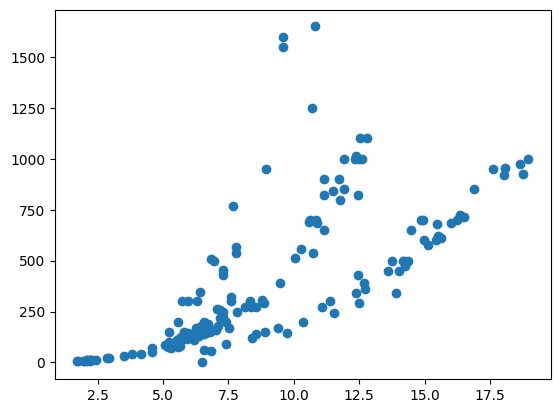

In [8]:
plt.figure()
plt.scatter(df['Height'] , df['Weight'])
plt.show()

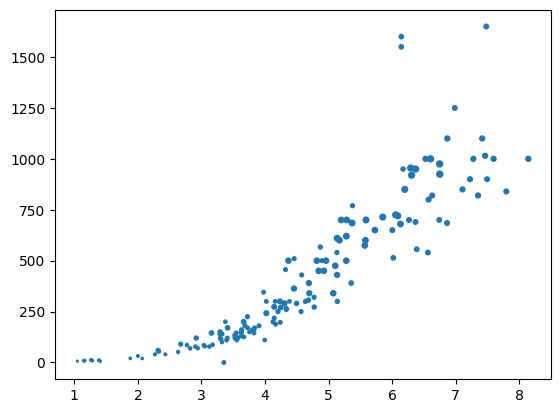

In [9]:
plt.figure()
plt.scatter(df['Width'] , df['Weight'] , s = df['Height'])
plt.show()

Below are the cells containing the Covariance Matrix and the HeatMap of the dataset.
Both of these are used to observe and understand the relationship between the features.

In [10]:
df.corr()

,Height,Width,Weight
Height,1.000000,0.792881,0.724345
Width,0.792881,1.000000,0.886507
Weight,0.724345,0.886507,1.000000


<Axes: >

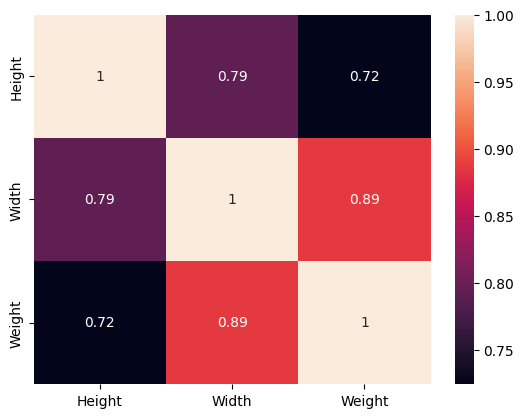

In [11]:
sns.heatmap(df.corr() , annot=True)

In [12]:
df.columns

Index(['Height', 'Width', 'Weight'], dtype='object')

In [13]:
X = df.iloc[: , :-1].values

#### Creating the Polynoimal Features Matrix

In [14]:


def generate_polynomial_feature_matrix(degree):
    global X
    for powers in itertools.product(range(degree + 1), repeat=2):
        temp =np.array([])
        if sum(powers) == degree:
            for i in range(len(X)):
                temp=np.append(temp,[(X[i][0]**powers[0])*(X[i][1]**powers[1])])
            temp=temp.reshape(len(temp),1)
            X=np.concatenate((X, temp), axis=1)
            
for degree in range(2,10):
    generate_polynomial_feature_matrix(degree)




In [15]:
X[0]

array([1.15200000e+01, 4.02000000e+00, 1.61604000e+01, 4.63104000e+01,
       1.32710400e+02, 6.49648080e+01, 1.86167808e+02, 5.33495808e+02,
       1.52882381e+03, 2.61158528e+02, 7.48394588e+02, 2.14465315e+03,
       6.14587171e+03, 1.76120503e+04, 1.04985728e+03, 3.00854624e+03,
       8.62150566e+03, 2.47064043e+04, 7.08004421e+04, 2.02890819e+05,
       4.22042628e+03, 1.20943559e+04, 3.46584527e+04, 9.93197452e+04,
       2.84617777e+05, 8.15621093e+05, 2.33730224e+06, 1.69661136e+04,
       4.86193107e+04, 1.39326980e+05, 3.99265376e+05, 1.14416346e+06,
       3.27879679e+06, 9.39595499e+06, 2.69257218e+07, 6.82037768e+04,
       1.95449629e+05, 5.60094460e+05, 1.60504681e+06, 4.59953713e+06,
       1.31807631e+07, 3.77717391e+07, 1.08241401e+08, 3.10184315e+08,
       2.74179183e+05, 7.85707509e+05, 2.25157973e+06, 6.45228817e+06,
       1.84901392e+07, 5.29866677e+07, 1.51842391e+08, 4.35130434e+08,
       1.24694094e+09, 3.57332330e+09])

In [16]:
Y = df["Weight"]
Y.shape

(159,)

In [17]:
type(X) , type(Y)

(numpy.ndarray, pandas.core.series.Series)

In [18]:
# X = X.to_numpy()
Y = Y.to_numpy()

### Normalizing the data

In [19]:
b = np.array([[5,5]])
X = (X - X.mean(axis=0)) / X.std(axis=0)
df1 = pd.DataFrame(X)
# X=np.concatenate((np.ones(159).reshape(159,1), X), axis=1)



In [20]:
df1.describe()

,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,53
count,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,...,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,159.000000,1.590000e+02,1.590000e+02,1.590000e+02
mean,4.468822e-17,-2.793014e-16,-5.446377e-17,-6.703233e-17,-1.787529e-16,2.066830e-16,-1.005485e-16,-2.234411e-17,-1.340647e-16,5.586028e-17,...,-1.228926e-16,1.117206e-17,6.144631e-17,-5.586028e-17,-6.703233e-17,-4.468822e-17,0.000000,4.468822e-17,-2.234411e-17,6.703233e-17
std,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,...,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160,1.003160e+00,1.003160e+00,1.003160e+00
min,-1.695083e+00,-2.005294e+00,-1.393413e+00,-1.355295e+00,-1.110502e+00,-1.031149e+00,-1.070673e+00,-9.595005e-01,-8.088756e-01,-8.166256e-01,...,-4.274640e-01,-4.755387e-01,-5.198770e-01,-5.262690e-01,-4.866329e-01,-4.350682e-01,-0.394576,-3.677704e-01,-3.510241e-01,-3.407206e-01
25%,-7.082613e-01,-6.140072e-01,-7.134430e-01,-7.605682e-01,-7.352600e-01,-7.141543e-01,-7.656299e-01,-7.398114e-01,-6.750683e-01,-6.710143e-01,...,-4.247660e-01,-4.722742e-01,-5.163127e-01,-5.232729e-01,-4.843936e-01,-4.336121e-01,-0.393688,-3.672182e-01,-3.506775e-01,-3.405332e-01
50%,-2.773402e-01,-1.005570e-01,-2.813285e-01,-3.759743e-01,-4.420437e-01,-3.953484e-01,-4.761583e-01,-4.971190e-01,-5.040592e-01,-4.536001e-01,...,-4.066548e-01,-4.503000e-01,-4.933995e-01,-5.049352e-01,-4.681075e-01,-4.236692e-01,-0.386625,-3.623414e-01,-3.473159e-01,-3.385949e-01
75%,7.945562e-01,6.944472e-01,5.804641e-01,8.360521e-01,6.284033e-01,4.251548e-01,7.163901e-01,6.714382e-01,4.224224e-01,2.698099e-01,...,-1.836802e-01,-4.920976e-02,-2.589524e-02,3.738973e-02,5.705073e-02,-1.701723e-02,-0.054677,-1.318307e-01,-1.838824e-01,-2.040313e-01
max,2.337161e+00,2.216321e+00,2.883415e+00,2.531799e+00,3.022888e+00,3.502438e+00,2.630067e+00,3.302119e+00,3.635920e+00,4.097073e+00,...,6.828848e+00,6.449374e+00,5.591577e+00,4.443445e+00,5.262693e+00,5.571437e+00,5.630442,5.788703e+00,5.925552e+00,6.050959e+00


In [21]:
X = df1.to_numpy()

### Splitting the Dataset into Training and Testing Set

In [22]:
def custom_train_test_split(X, y, test_size, random_state=None):
    if random_state is not None:
        random.seed(random_state)
    num_samples = len(X)
    num_test = int(test_size * num_samples)
    indices = list(range(num_samples))
    random.shuffle(indices)
    test_indices = indices[:num_test]
    train_indices = indices[num_test:]
    X_train = [X[i] for i in train_indices]
    Y_train = [y[i] for i in train_indices]
    X_test = [X[i] for i in test_indices]
    Y_test = [y[i] for i in test_indices]
    X_train = np.array(X_train)
    X_test = np.array(X_test)
    Y_train = np.array(Y_train)
    Y_test = np.array(Y_test)
    return X_train, X_test, Y_train, Y_test

In [23]:
X_train , X_test , Y_train , Y_test = custom_train_test_split(X , Y , test_size=0.2 , random_state=42)

In [24]:
print(X.shape,Y.shape)

(159, 54) (159,)


## Polynomaial Regression

By fitting a polynomial equation to the data, polynomial regression is a sort of regression analysis used to represent the relationship between a dependent variable and one or more independent variables.

The general equation for polynomial regression with one independent variable (simple polynomial regression) is:

y = β₀ + β₁x + β₂x² + β₃x³ + ... + βₘxᵐ + ε<br>
The degree of the polynomial, denoted by m, determines the complexity of the model. A higher degree allows the model to capture more complex patterns in the data but may also lead to overfitting if not chosen carefully.

### Batch Gradient Descent

In batch gradient descent, the cost function's gradient is calculated for each iteration using the whole training dataset. After analyzing the complete dataset, the coefficients are updated.
 Gradient is defined as (Loss) = -2/n * (yi - i) * xi + q * Wi (q-1)/2. 

 <li>Batch Gradient Descent is an optimization algorithm used to minimize a cost function by iteratively adjusting model parameters
 <li>The gradients of the cost function J(θ) with respect to each parameter θₖ for all k. This is done by taking the partial derivatives of J(θ) with respect to each θₖ: ∂J(θ) / ∂θₖ for all k = 0, 1, 2, ..., n
<li>The gradients represent the direction of steepest ascent in the cost function.
<li>The model parameters θ are adjusted in the opposite direction of the gradients to minimize the cost function. This is done using the learning rate (α): θₖ := θₖ - α * ∂J(θ) / ∂θₖ for all k.

#### Functions Used

In [25]:
def predict_Y( bias ,weights , features):
    return bias + np.dot(features, weights)

In [26]:
Q=0.5
_lambda=.75 #lambda
def update_theta_bgd(x , y , y_hat , b_0 , theta_o , learning_rate):
    global Q
    global _lambda
    grad_b = (np.sum(y_hat-y))/len(y) + Q*_lambda/2
    grad_w = 2*(np.dot((y_hat-y),x))/len(y) + Q*_lambda/2*(abs(theta_o)**(Q-1))
    b_1 = b_0 - learning_rate*grad_b
    theta_1 = theta_o - learning_rate*grad_w
    return b_1 , theta_1

In [27]:
def get_cost(Y,Y_hat,theta_o):
    n = len(Y)
    sum = 0
    for i in range(n):
        sum += (Y[i] - Y_hat[i])**2 
    sum /= (2*n)
    sum += _lambda/2*(np.sum(abs(theta_o)**Q))
    return sum

In [28]:
import math
def get_error_value(Y,Y_hat):

  n = len(Y)
  sum = 0
  for i in range(n):
    sum += (Y[i] - Y_hat[i])**2

  sum /= (2*n)
  return sum

In [29]:
def run_gradient_descent(X,Y,alpha,num_iterations):
    b=random.random()
    j = []
    theta=np.random.rand(X.shape[1])
    for each_iter in range(num_iterations):
        Y_hat = predict_Y(b,theta,X)
        prev_b = b
        prev_theta = theta
        b,theta = update_theta_bgd(X,Y,Y_hat,prev_b,prev_theta,alpha)
        j.append(get_cost(Y,Y_hat,theta))
    print("Final Estimate of b and theta : ",theta,b)
    return b , theta , j


In [30]:
X_train.shape,Y_train.shape,X_test.shape,Y_test.shape

((128, 54), (128,), (31, 54), (31,))

### Evaluation of Batch Gradient Descent

####  Q = 0.5

Final Estimate of b and theta :  [] 390.14575263216847
-0.010684147762654916


Final Estimate of b and theta :  [ 33.48700547 289.23112893] 388.6091033319525
0.7526253060515234


Final Estimate of b and theta :  [-59.12885407  54.6089322  203.32589544 101.54990818  33.06410337] 391.1224775419266
0.7676757373238589


Final Estimate of b and theta :  [-2.09587569e+01  5.12980678e+01  9.50723850e+01  3.39556622e+01
 -1.69421123e-02  1.01284939e+02  5.14366337e+01  1.95261142e+01
  8.96201372e+00] 392.23425349030583
0.7446224407764067


Final Estimate of b and theta :  [-8.82762724e+00  6.00500918e+01  8.27057604e+01  3.12102182e+01
  1.12366667e+01  6.91711850e+01  3.25434687e+01  1.21876869e+01
  7.72025001e+00  3.97958524e+01  1.19545501e+01 -3.41506099e+00
 -1.78592027e+00 -5.03434696e-03] 392.4501856629156
0.7378377099911847


Final Estimate of b and theta :  [-1.45398199e+01  6.16798291e+01  8.53762698e+01  3.18760203e+01
  8.85698165e+00  7.19746407e+01  3.55641810e+01  1.53954881e+

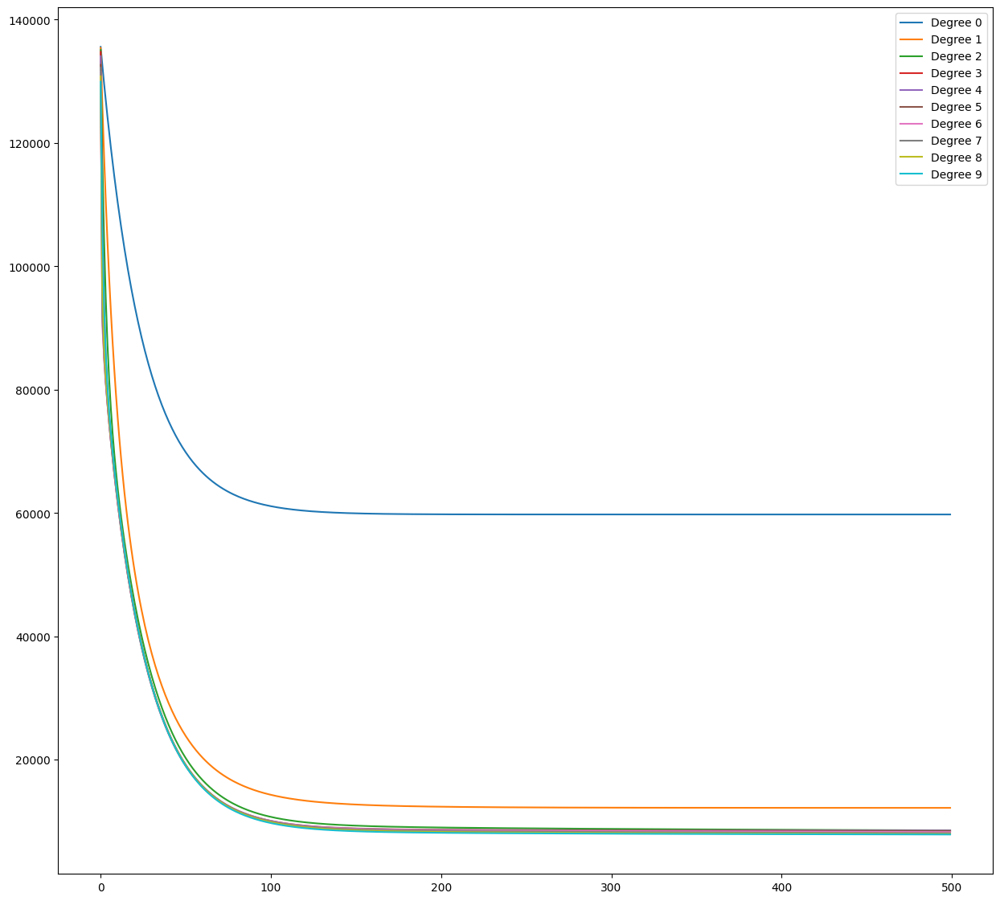



Minimum Cost Function Value: 7881.696037010821


In [31]:
plt.figure(figsize=(15,14))
Q=0.5
_lambda=.75 #lambda
costs = []
train_errors = []
test_errors = []
all_b = []
all_theta = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.02 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors.append(get_error_value(Y_train , y_train_pred))
    test_errors.append(get_error_value(Y_test , y_test_pred))
    costs.append(cost_curve[-1])
    all_b.append(b)
    all_theta.append(theta)
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i-1}')
plt.legend()
plt.show()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')

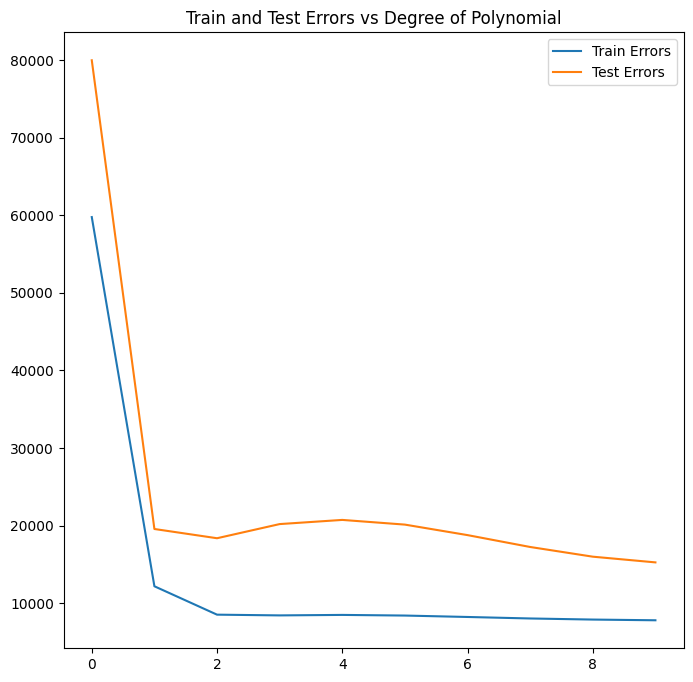

In [32]:
plt.figure(figsize=(8,8))
plt.plot(train_errors , label = "Train Errors")
plt.plot(test_errors , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")
plt.show()

In [33]:
import ipympl
from scipy.interpolate import griddata
%matplotlib widget
from mpl_toolkits.mplot3d import Axes3D

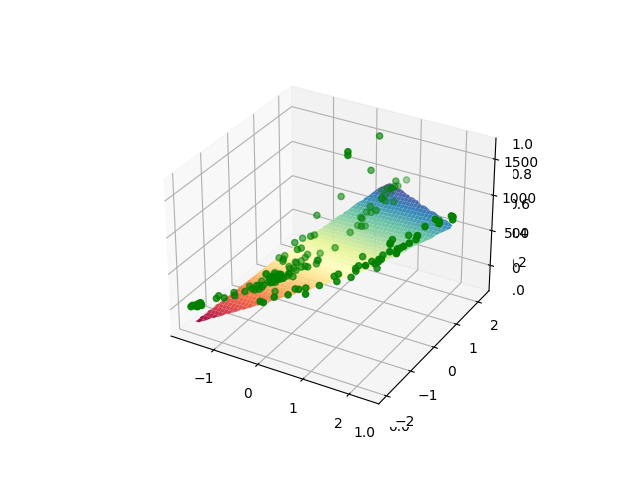

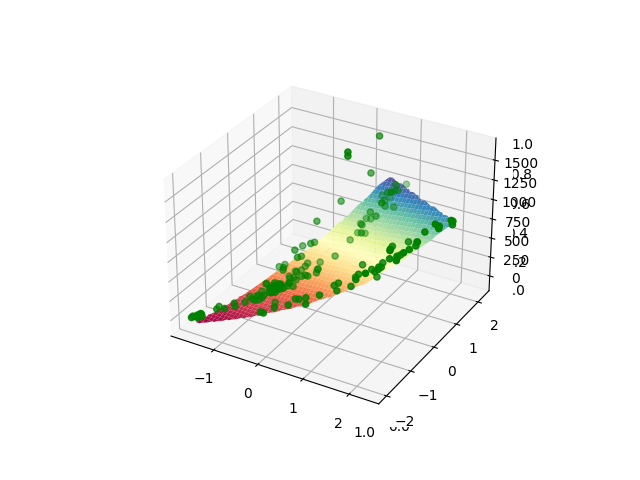

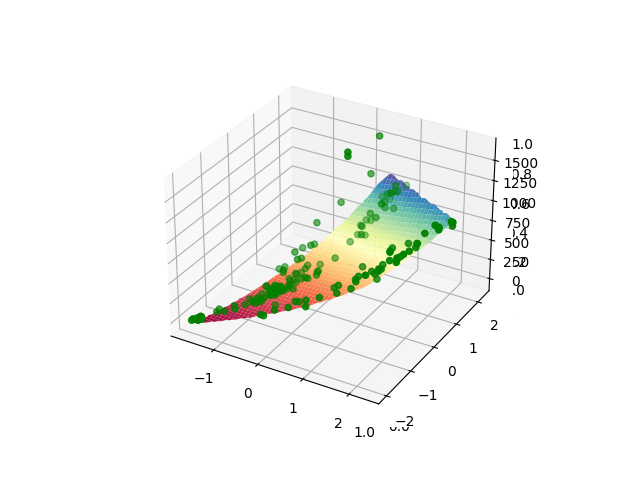

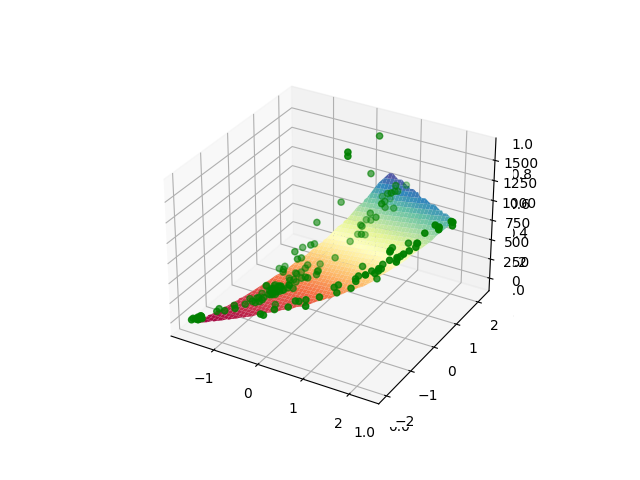

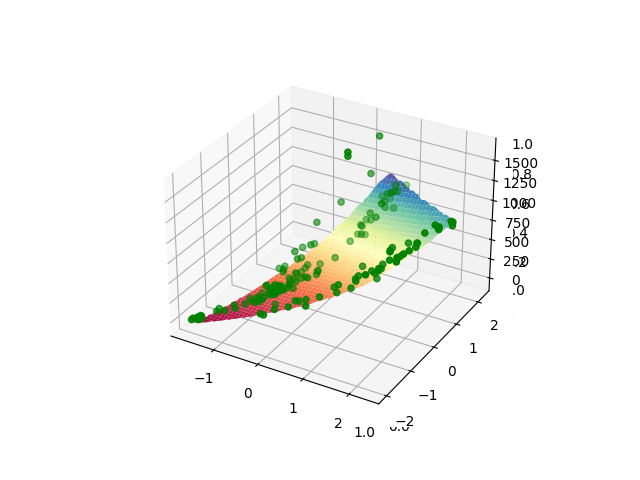

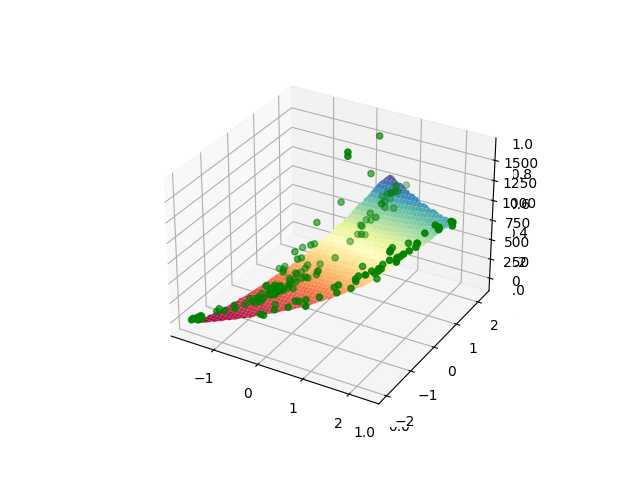

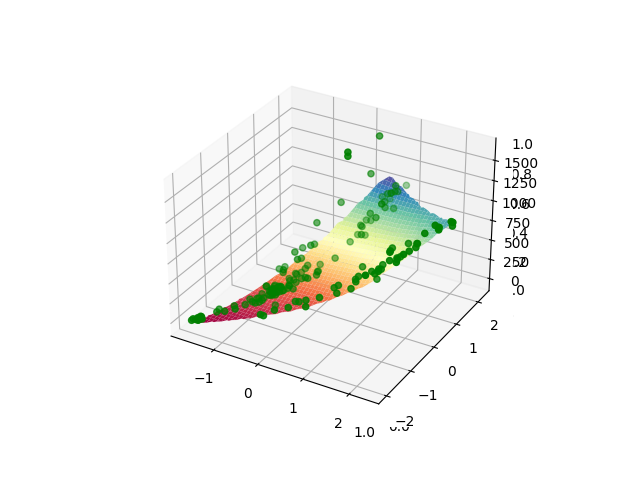

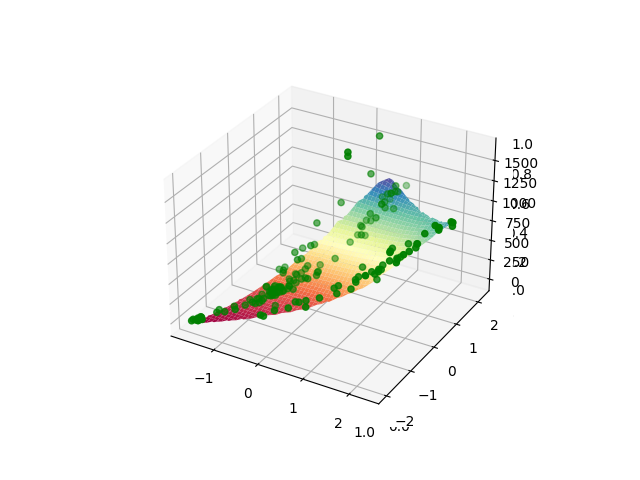

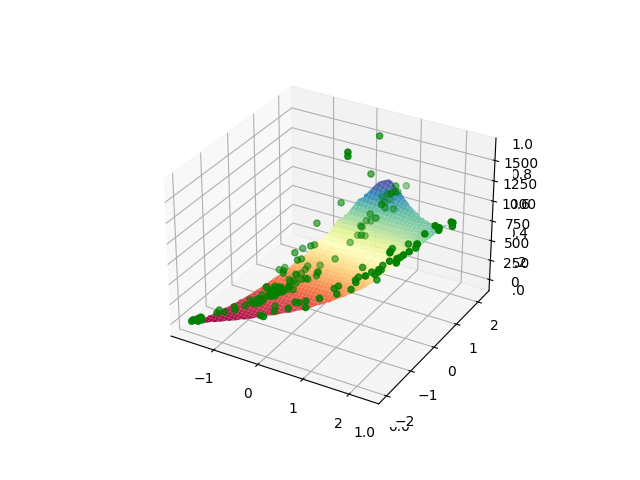

In [34]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y

        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

#### Q = 1

Final Estimate of b and theta :  [] 387.54234340226685
-0.012079897920660887


Final Estimate of b and theta :  [ 49.57547832 272.31403805] 385.7114187323986
0.7456571361503286


Final Estimate of b and theta :  [-29.08336861  85.95919558 174.2530274   85.68873918  16.09024435] 387.99796315456996
0.7680072871768772


Final Estimate of b and theta :  [-12.2964215   58.97017731  89.00514791  34.53167792  -0.56771428
  95.13630937  54.05388975  19.48584748   1.10246603] 389.3808823452998
0.7456949332844955


Final Estimate of b and theta :  [ 2.29732647 62.67566377 70.83118592 29.94213829  5.55612708 61.63653367
 32.02132924 10.12040905  1.91150734 43.61302458 22.33854312  4.96839246
 -2.33631895 -2.38616464] 389.87499671175374
0.7325563138473905


Final Estimate of b and theta :  [ 3.8592794  64.82461452 69.73578352 30.70598652  6.57176468 57.33719763
 31.57353298 12.79478595  4.81790184 36.44873356 19.11142515  6.43548825
  1.0663249   2.46286045 13.56801467  1.38820689 -6.29505888 -7.4

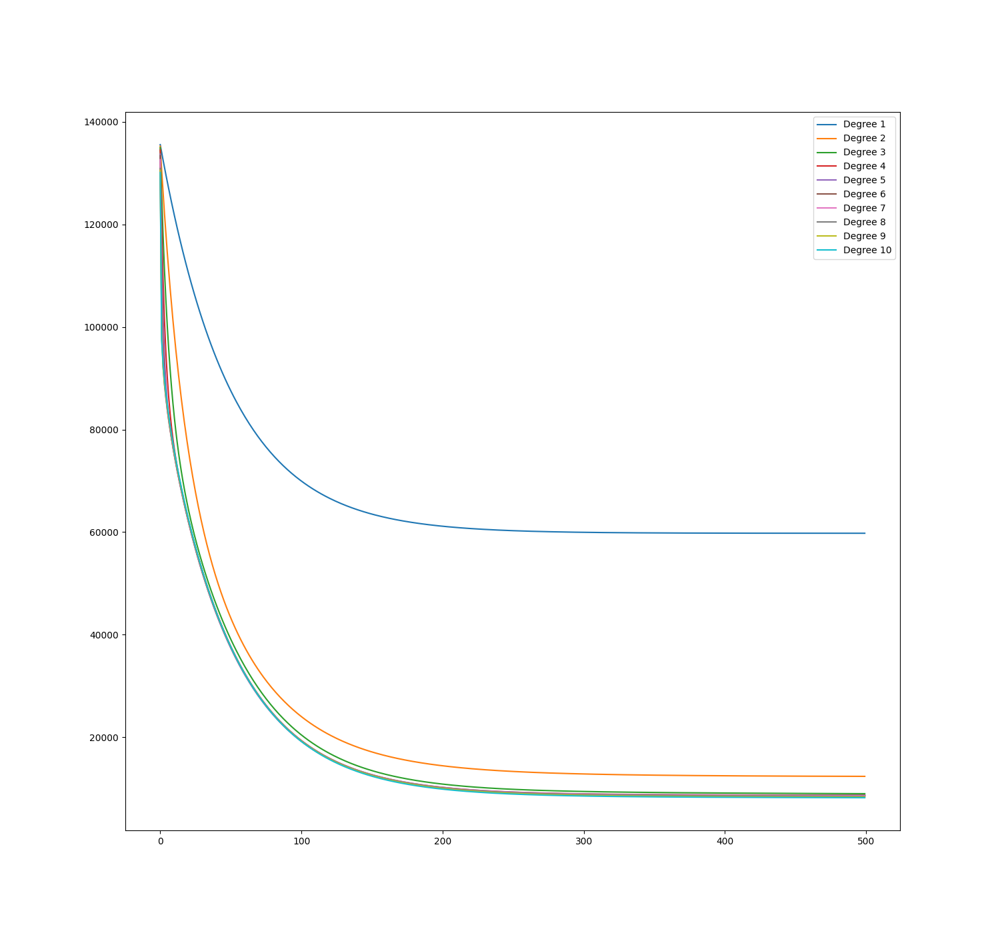



Minimum Cost Function Value: 8182.474806913153


In [35]:
plt.figure(figsize=(15,14))
Q=1
_lambda=.5 #lambda
costs = []
all_b = []
all_theta = []
train_errors1 = []
test_errors1 = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.01 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors1.append(get_error_value(Y_train , y_train_pred))
    test_errors1.append(get_error_value(Y_test , y_test_pred))
    costs.append(cost_curve[-1])
    all_b.append(b)
    all_theta.append(theta)
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i}')
plt.legend()
plt.show()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')  

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

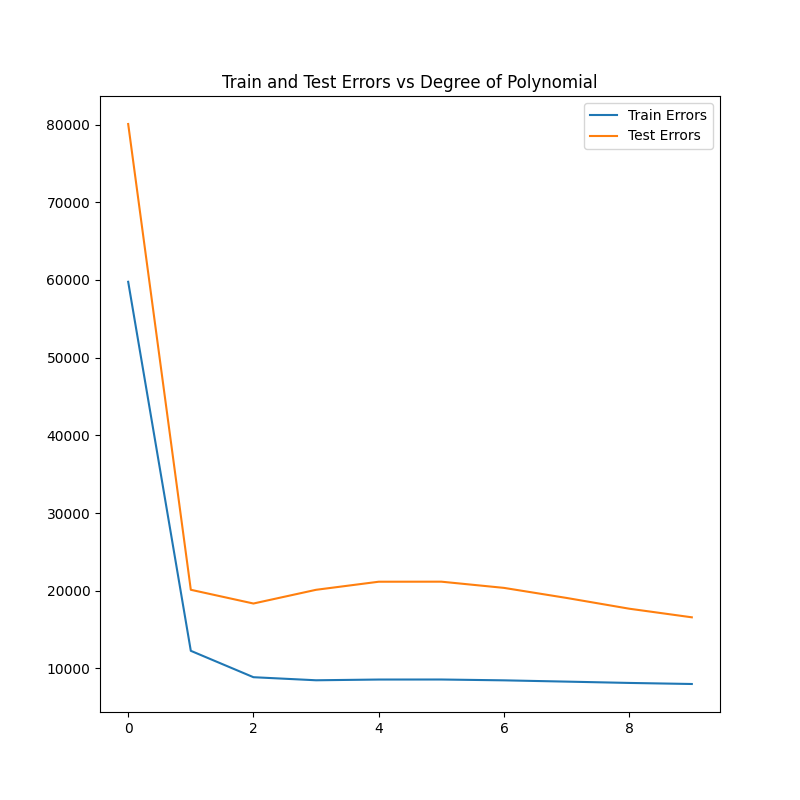

In [36]:
plt.figure(figsize=(8,8))
plt.plot(train_errors1 , label = "Train Errors")
plt.plot(test_errors1 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

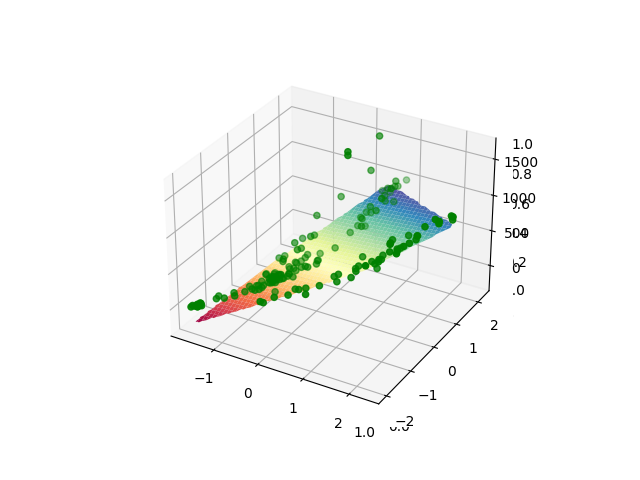

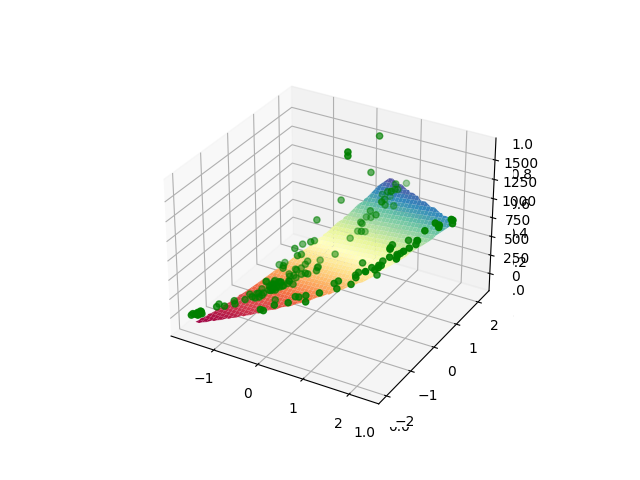

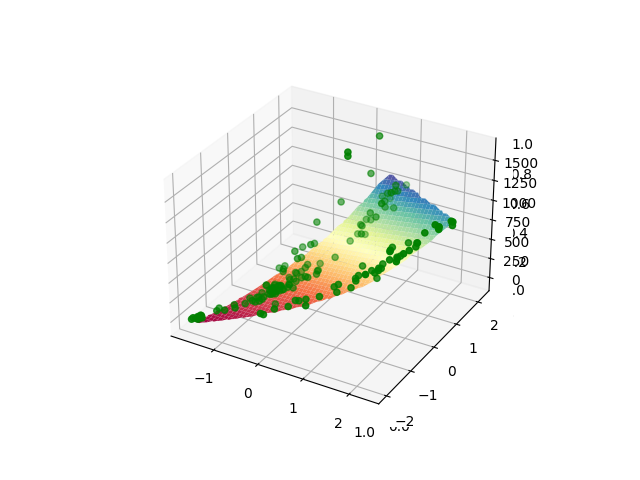

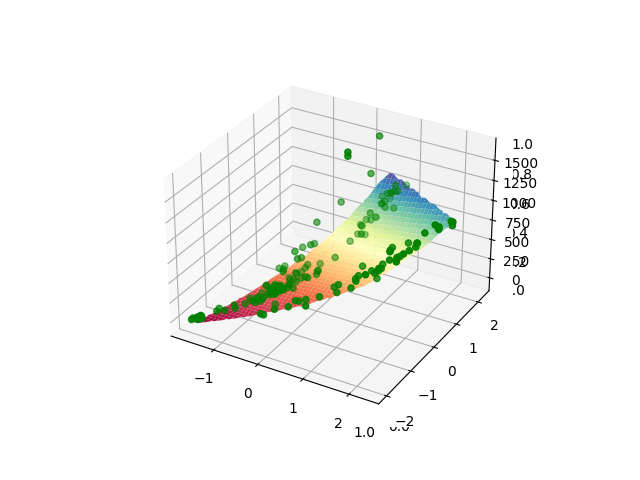

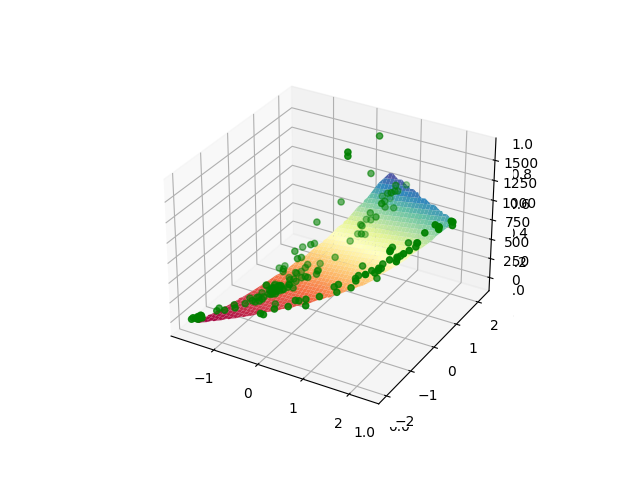

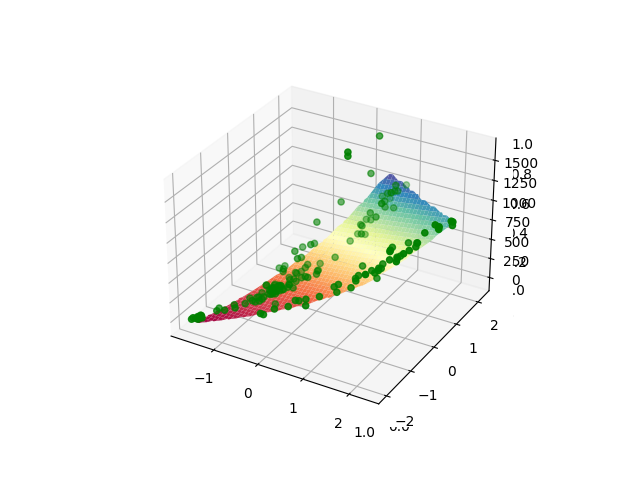

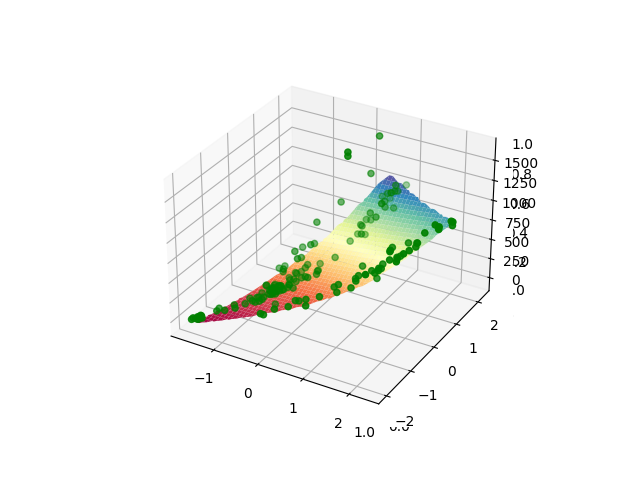

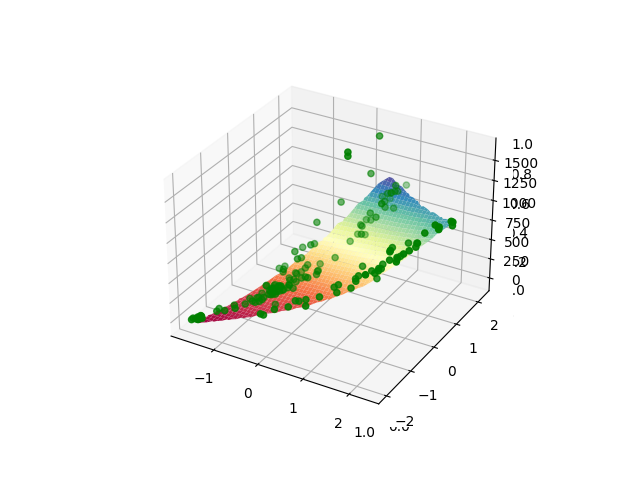

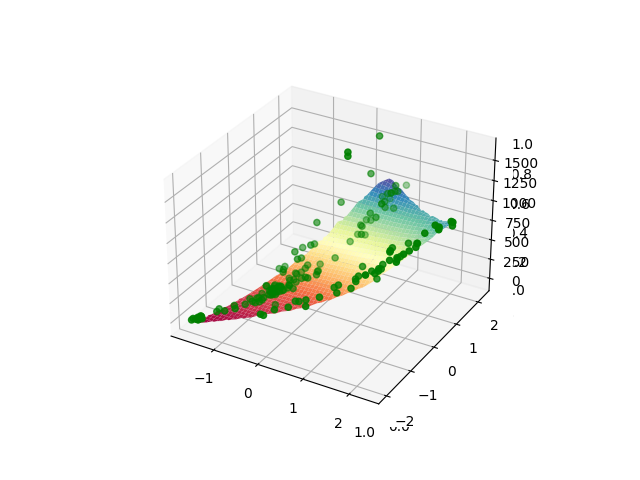

In [37]:

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

#### Q = 2

C:\Users\agarw\AppData\Local\Temp\ipykernel_26656\4064408270.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,14))


Final Estimate of b and theta :  [] 387.7760841751274
-0.011951083772312243


Final Estimate of b and theta :  [ 51.13960558 269.89835315] 385.934986191518
0.7451315111123309


Final Estimate of b and theta :  [-28.11519197  86.3344475  172.89716937  84.93914631  16.50197424] 388.20609282362926
0.768114495386744


Final Estimate of b and theta :  [-12.13242737  59.20134137  88.19250536  35.07538619  -0.47070143
  94.50928359  54.66145524  18.88196239   1.26558327] 389.6013648780857
0.7459559392822579


Final Estimate of b and theta :  [ 3.13307188 61.87649423 70.86690022 29.76740961  4.87945165 61.054974
 31.91243654 10.55997228  2.14987969 43.51597885 22.9538381   5.9117782
 -2.50878693 -3.12950895] 390.11560504003586
0.7323286278845236


Final Estimate of b and theta :  [ 3.70682544e+00  6.45710027e+01  6.94214022e+01  3.05572798e+01
  7.47650145e+00  5.64421900e+01  3.08046659e+01  1.20872902e+01
  5.50511263e+00  3.63497439e+01  1.96603037e+01  6.26814150e+00
  1.65771968e+00  2.19

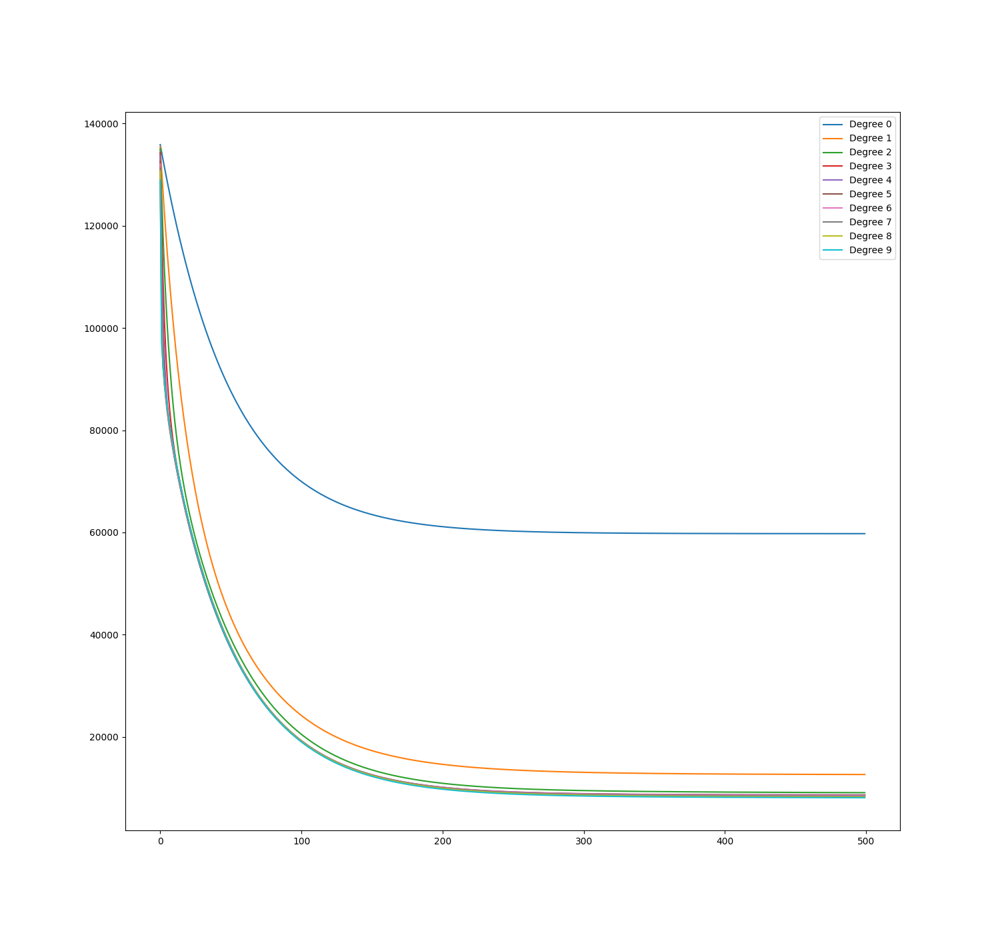

In [38]:
theta_plot = []
b_plot = 0
all_b = []
all_theta = []
train_errors2 = []
test_errors2 = []
plt.figure(figsize=(15,14))
Q=2
_lambda=.01 #lambda
costs = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.01 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors2.append(get_error_value(Y_train , y_train_pred))
    test_errors2.append(get_error_value(Y_test , y_test_pred))
    b_plot , theta_plot = b , theta
    all_b.append(b)
    all_theta.append(theta)
    costs.append(cost_curve[-1])
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i-1}')
plt.legend()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')  

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

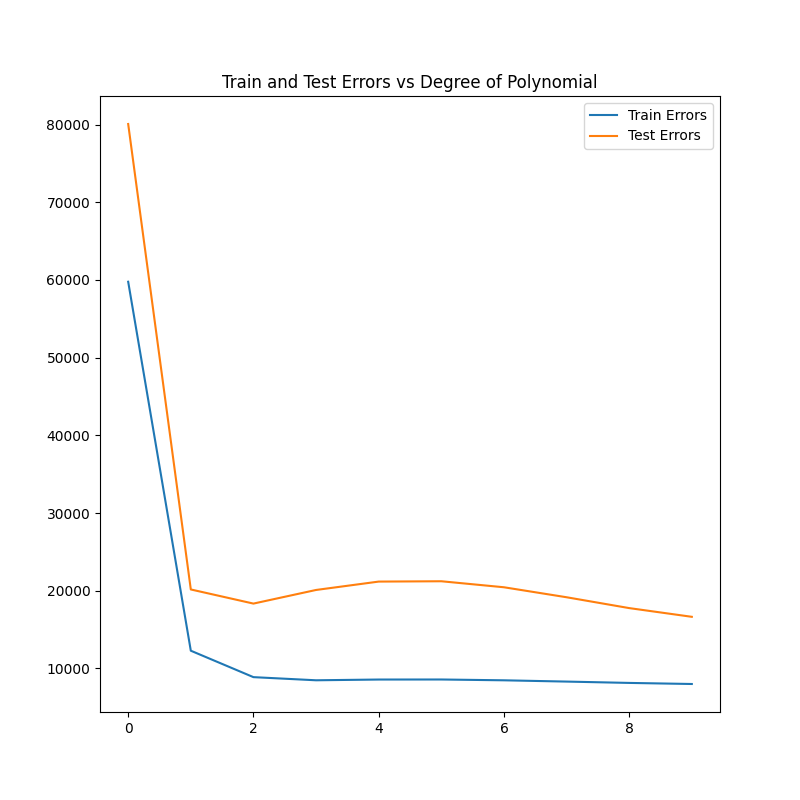

In [39]:
plt.figure(figsize=(8,8))
plt.plot(train_errors2 , label = "Train Errors")
plt.plot(test_errors2 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

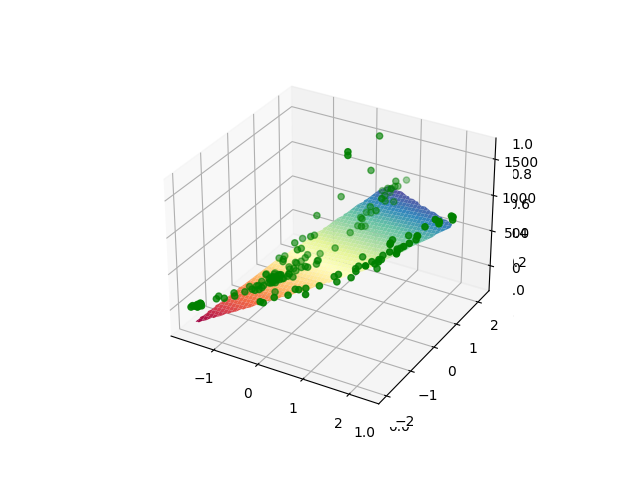

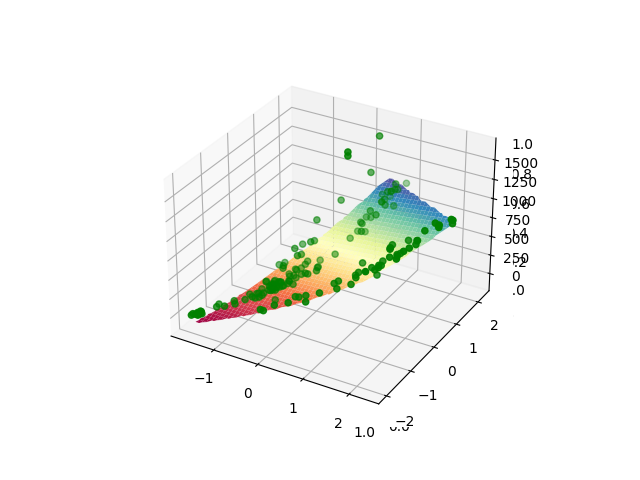

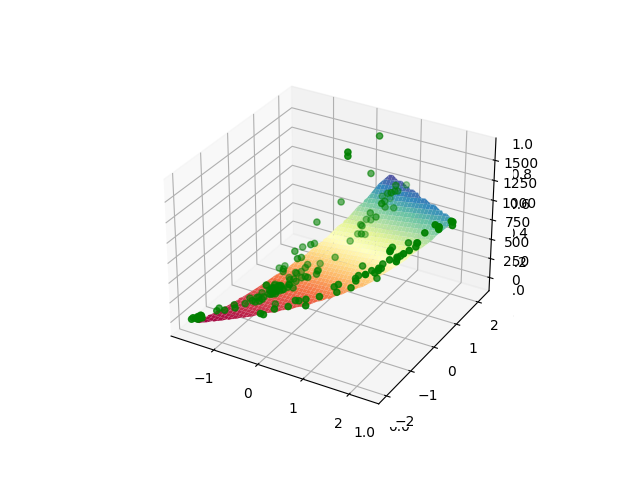

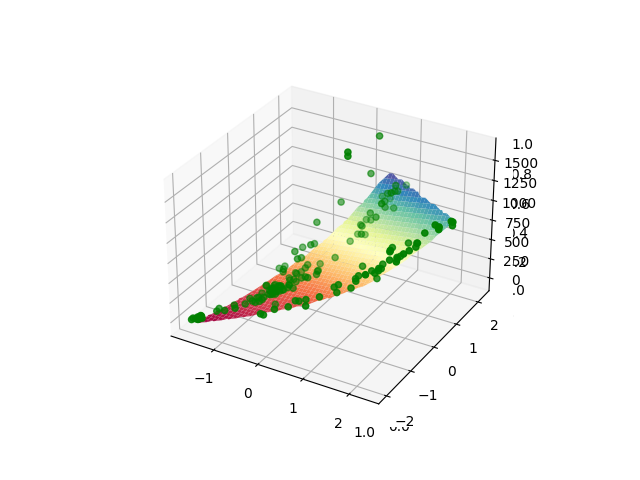

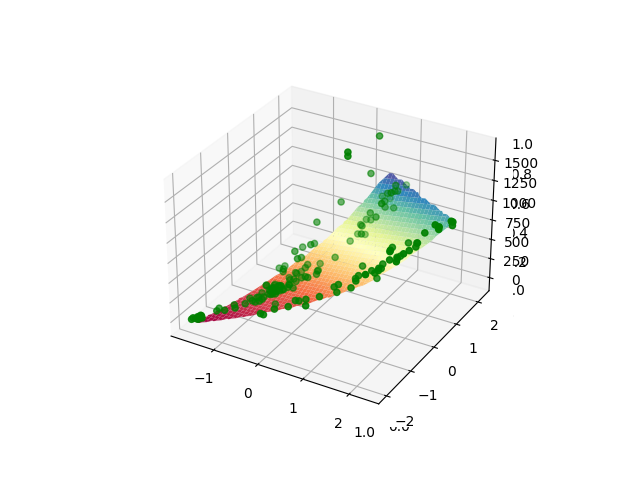

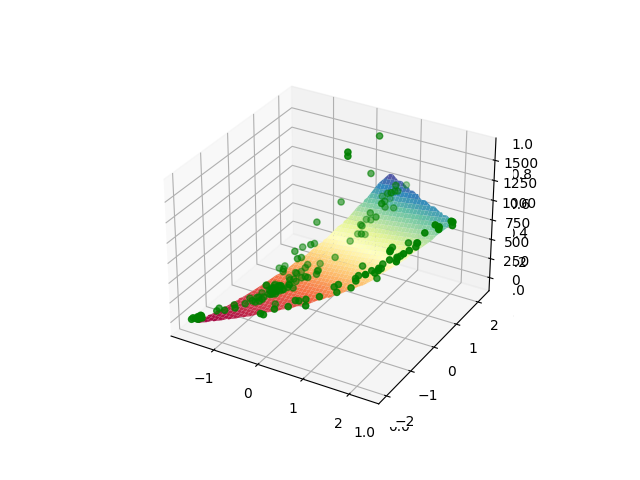

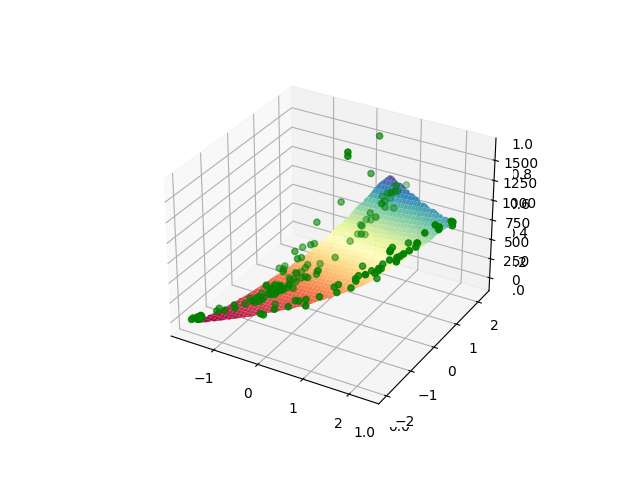

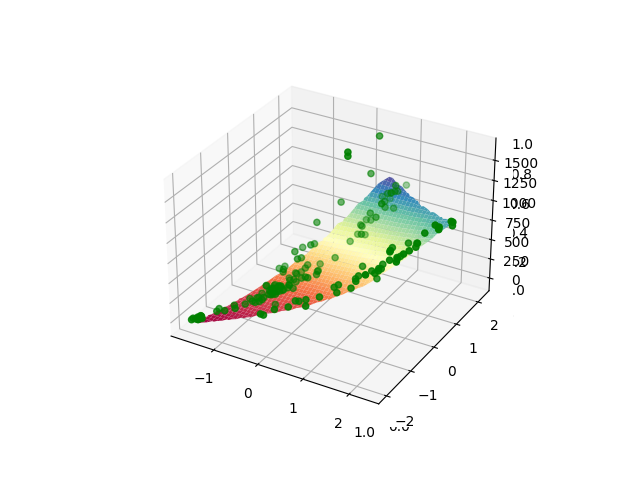

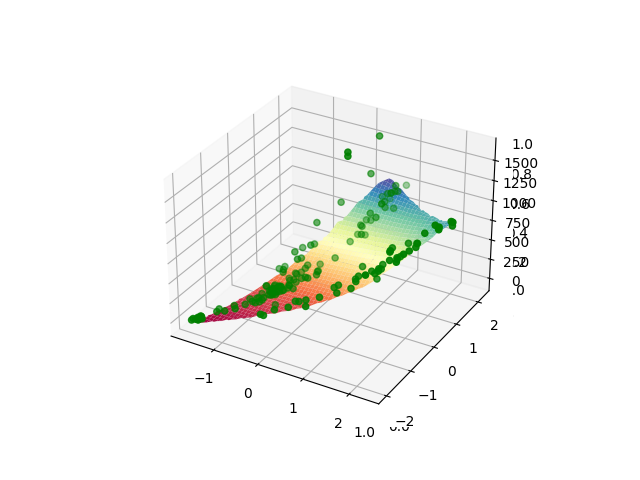

In [40]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

#### Q = 4

Final Estimate of b and theta :  [] 390.3332098436963
-0.010586953439360114


Final Estimate of b and theta :  [ 64.45756046 247.9899145 ] 388.4590497565629
0.7390713809512817


Final Estimate of b and theta :  [-58.74400057  76.0173158  173.29476683 108.32221148  31.45737049] 391.0153925546433
0.7691937057886579


Final Estimate of b and theta :  [-22.70150179  54.09695918  92.53435306  35.69396943   2.84521517
  97.44916703  54.18960956  18.40470736   7.22787638] 392.35330410240914
0.745554704906509


Final Estimate of b and theta :  [-8.34077123 60.34304225 80.38982672 31.71271308  8.87200757 68.93389023
 32.42922137 10.5106112   9.79412192 41.91284871 12.97839181 -4.20082901
 -4.34876404  4.14252196] 392.6412391923358
0.737504112670266


Final Estimate of b and theta :  [-13.67415523  61.93139383  82.21727474  32.06736226   6.79206629
  71.49291532  35.83599565  13.98160463  12.34267388  43.3903816
  17.27067865   2.31014809   2.89159983  11.89447395   7.28037369
 -11.29478772 -19.

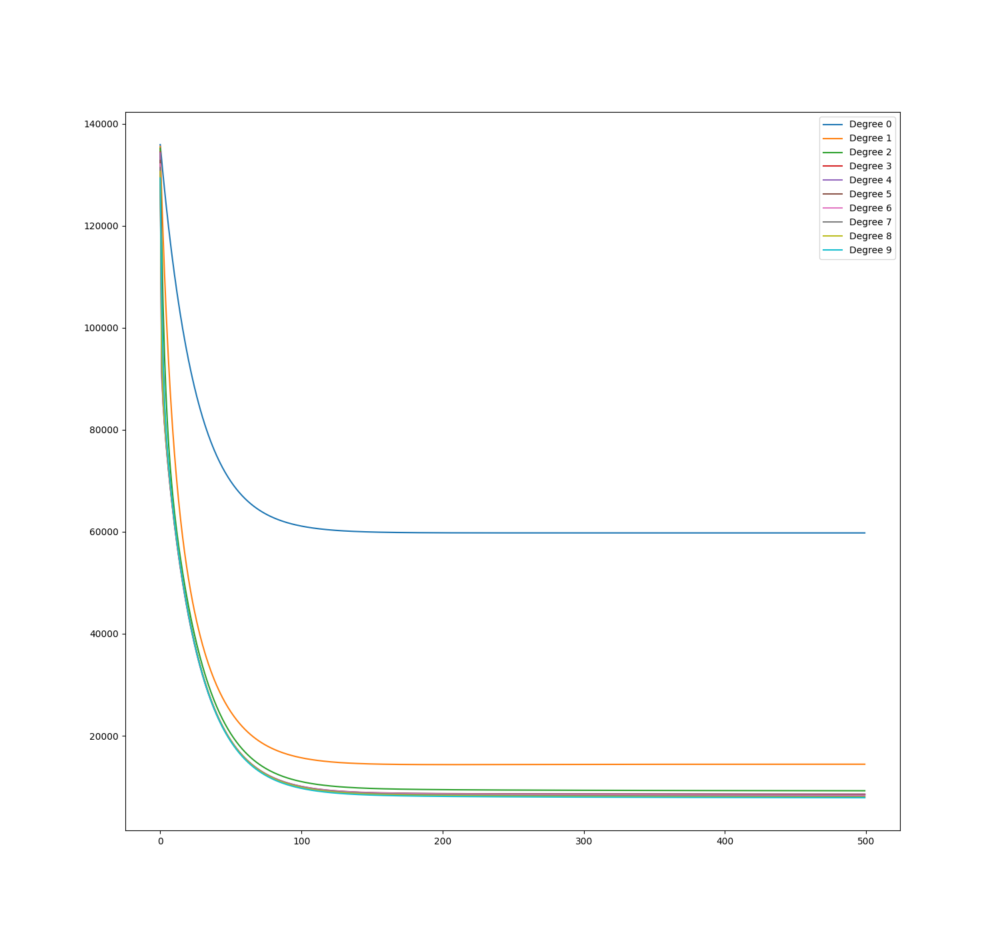

In [41]:
theta_plot = []
b_plot = 0
all_b = []
all_theta = []
train_errors3 = []
test_errors3 = []
plt.figure(figsize=(15,14))
Q= 4
_lambda=1e-6 #lambda
costs = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.02 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors3.append(get_error_value(Y_train , y_train_pred))
    test_errors3.append(get_error_value(Y_test , y_test_pred))
    b_plot , theta_plot = b , theta
    all_b.append(b)
    all_theta.append(theta)
    costs.append(cost_curve[-1])
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i-1}')
plt.legend()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')  

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

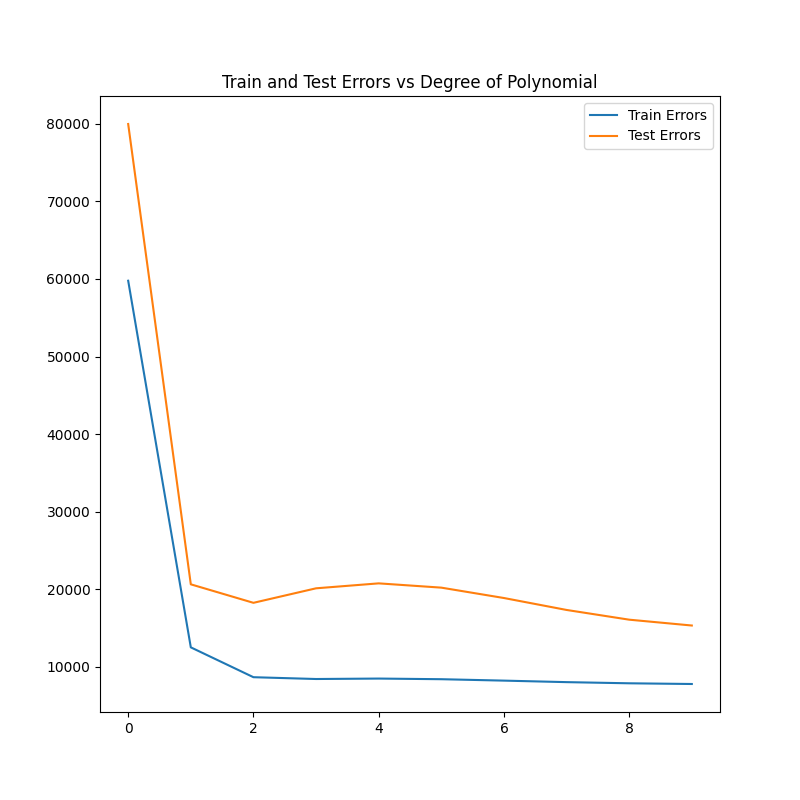

In [42]:
plt.figure(figsize=(8,8))
plt.plot(train_errors3 , label = "Train Errors")
plt.plot(test_errors3 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

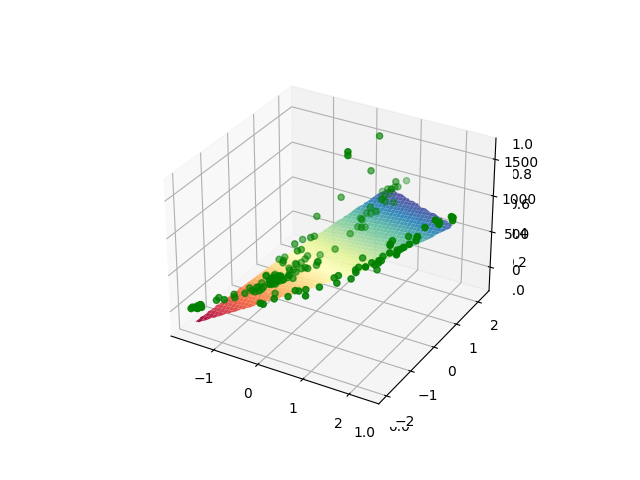

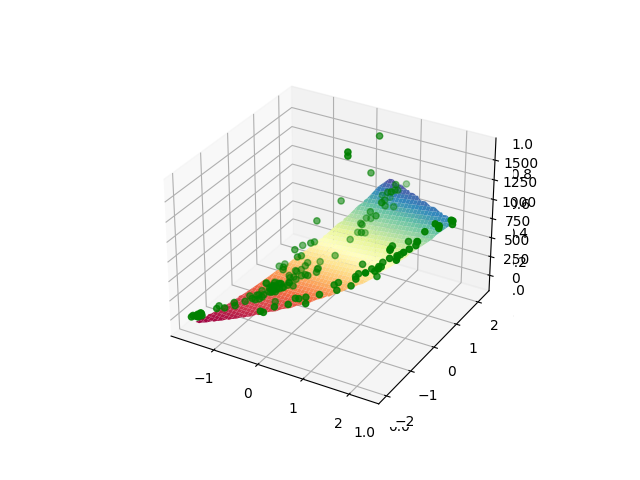

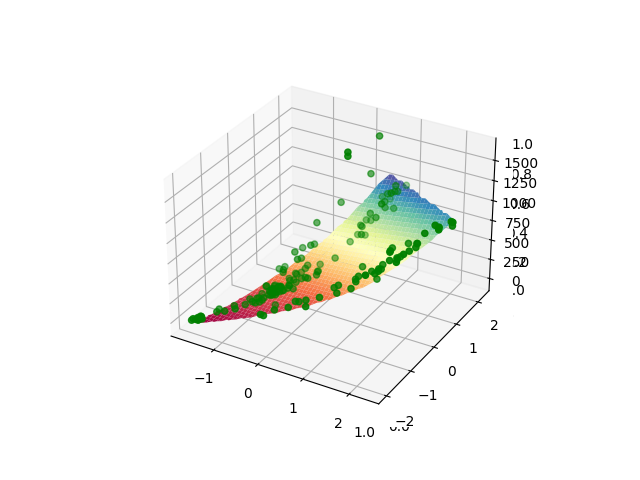

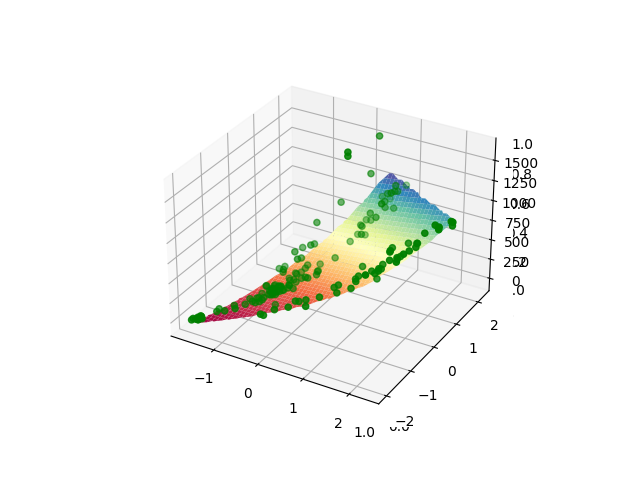

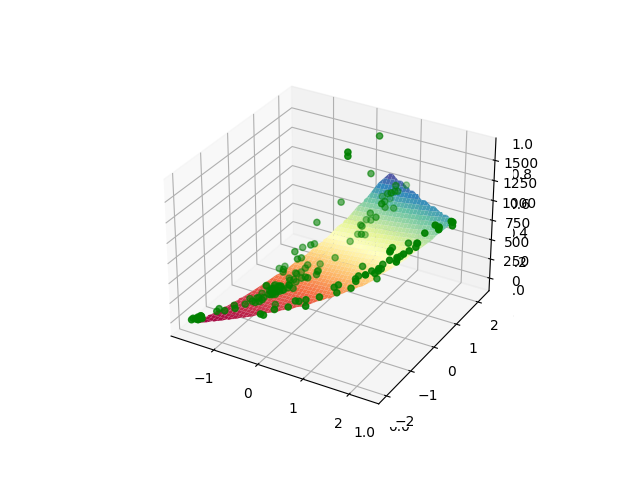

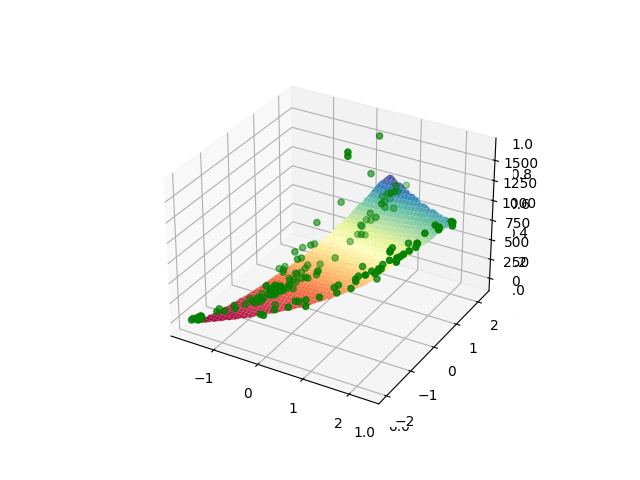

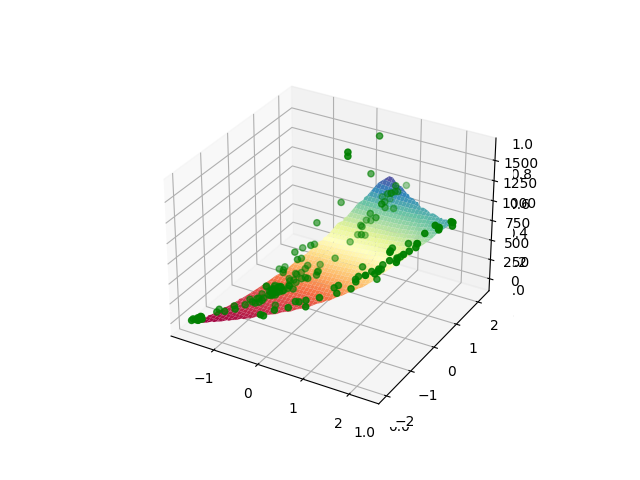

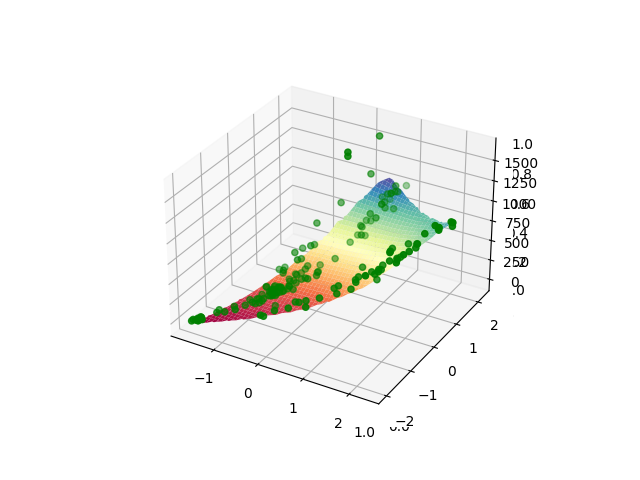

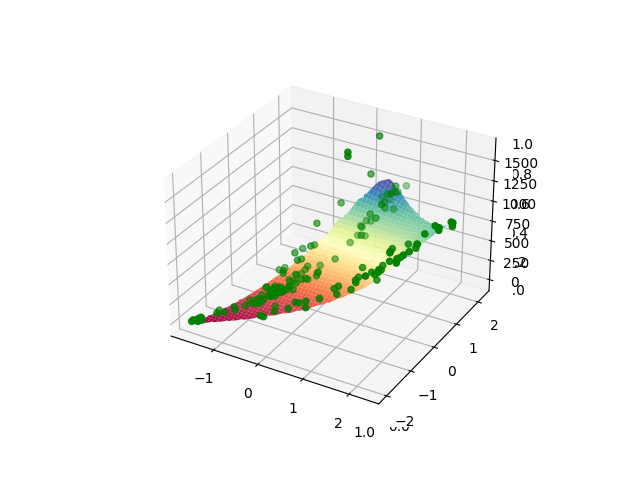

In [43]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

In [44]:
%pip install ipympl

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


### Stochastic Gradient Descent

A popular variation of the gradient descent optimization approach for machine learning model training is called Stochastic Gradient Descent (SGD). One training example at a time is processed by SGD, which incrementally changes the model parameters in contrast to Batch Gradient Descent, which processes the whole training dataset in each iteration. 

<li>Shuffle the training dataset randomly. This randomization helps to introduce variability in the training examples and prevents the algorithm from getting stuck in local minima.
<li>Calculate the gradient of the cost function J(θ) with respect to each parameter θₖ using the current training example (xᵢ, yᵢ). This is done by taking the partial derivatives of J(θ) with respect to each θₖ: ∂J(θ) / ∂θₖ for all k = 0, 1, 2, ..., n .
The gradients represent the direction of steepest ascent in the cost function based on the current training example.
<li>Adjust the model parameters θ in the opposite direction of the gradients to minimize the cost function. This is done using the learning rate (α) and the gradients from the current training example: θₖ := θₖ - α * ∂J(θ) / ∂θₖ for all k.

#### Functions Used

In [45]:
Q=0.5
_lambda=.75 #lambda
def update_theta_SGD(x , y , y_hat , b_0 , theta_o , learning_rate , batch_size):
  global Q
  global _lambda
  dat1 = np.c_[x , y]
  temp = dat1[np.random.randint(127, size = batch_size)]

  x1 = np.delete(dat1 , x.shape[1] , 1)
  y1 = dat1.T[x.shape[1]]


  y_hat1 = b_0 + np.dot(x1 , theta_o)

  grad_b = (np.sum(y_hat1-y1))/len(y)
  grad_w = (np.dot((y_hat1-y1),x1))/len(y)  + Q*_lambda/2*(np.sum(abs(theta_o)**(Q-1)))
  b_1 = b_0 - learning_rate*grad_b
  theta_1 = theta_o - learning_rate*grad_w
  return b_1 , theta_1

In [46]:
def predict_Y( bias ,weights , features):
    # print( bias ,type(weights) , weights, features.shape , len(features))
    return bias + np.dot(features, weights)

In [47]:
def get_cost(Y,Y_hat,theta_o):
    n = len(Y)
    sum = 0
    for i in range(n):
        sum += (Y[i] - Y_hat[i])**2 
    sum /= (2*n)
    sum += _lambda/2*(np.sum(abs(theta_o)**Q))
    return sum

In [48]:
def run_gradient_descent_SGD(X,Y,alpha,num_iterations , k):
  b=random.random()
  theta=np.random.rand(X.shape[1])
  J = []

  for each_iter in range(num_iterations):

    Y_hat = predict_Y(b,theta,X)
    prev_b = b
    prev_theta = theta
    b,theta = update_theta_SGD(X,Y,Y_hat,prev_b,prev_theta,alpha , k)
    J.append(get_cost(Y , predict_Y(b , theta , X) , theta))


  print("Final Estimate of b and theta : ",b,theta)
  return b,theta,J

### Evaluation of Stochastic Gradient Descent

### Q = 0.5

Final Estimate of b and theta :  390.3491239289438 []
-0.01057872262817905


Final Estimate of b and theta :  388.76218659069696 [ 37.57407548 284.90897952]
0.7515832287317613


Final Estimate of b and theta :  391.19382677940536 [-45.79807776  67.13809345 191.72438814  95.35673771  24.6385518 ]
0.7687465049858263


Final Estimate of b and theta :  392.41467468192985 [-18.18465501  52.50587934  91.53864557  34.65093641   1.44660932
  99.68582323  54.70017476  18.51690615   4.50998325]
0.7450382109240314


Final Estimate of b and theta :  392.7068127306619 [-2.97118074 59.90913057 76.38116963 30.77533234  7.10310744 65.13179427
 32.75356906 11.36152631  5.75829499 41.80157632 18.03183387  1.02639061
 -4.32602376 -0.38874776]
0.7357146002266017


Final Estimate of b and theta :  392.6102685546609 [ -6.22961607  61.94077901  77.02614745  33.01516506   6.4578623
  63.77373743  34.81762572  14.75909365   8.31644791  37.89140601
  18.93193866   6.2914026    2.07043013   5.13016946   7.155544

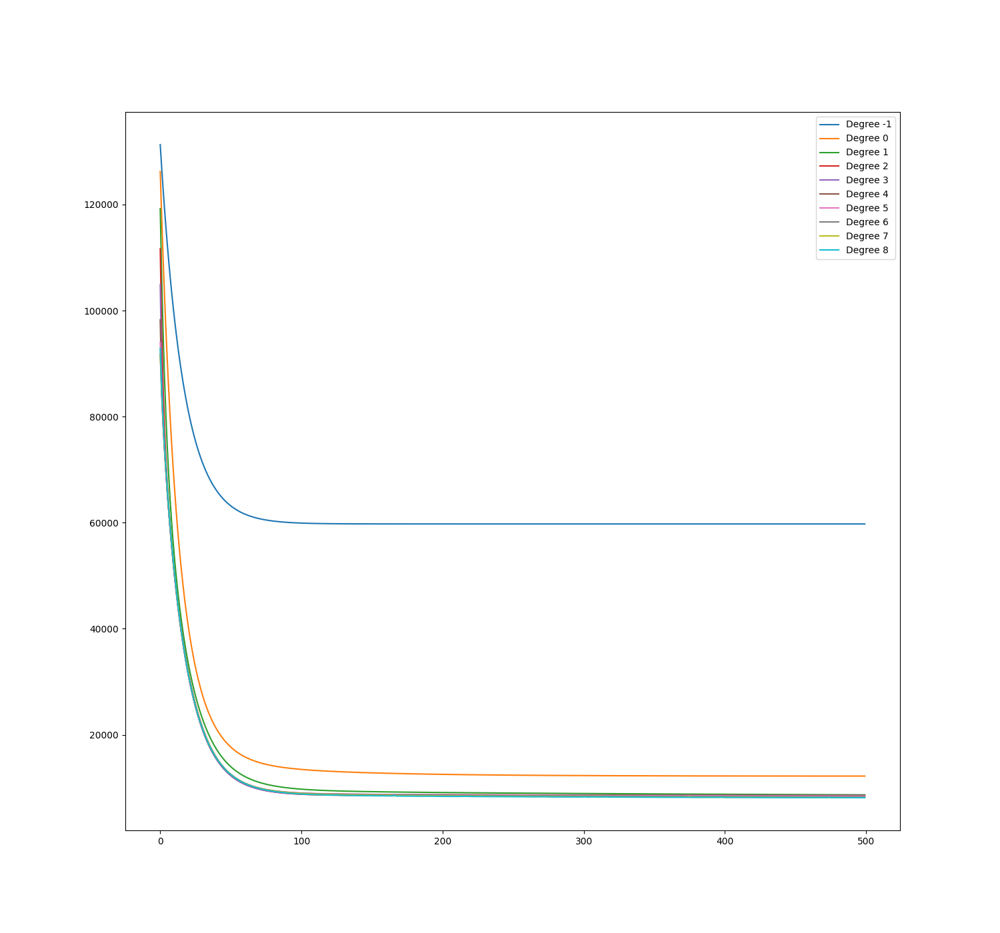

In [49]:
plt.figure(figsize=(15,14))
best_b1 = None
best_theta1 = None
best_r2_score1 = 0
train_errors5 = []
test_errors5 = []
r2_scores = []
costs = []

all_b = []
all_theta = []
Q=0.5
_lambda=0.9 #Lambda
for i in range(0,10):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]


    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    b_plot , theta_plot = b , theta
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors5.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors5.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score1:
        best_r2_score1 = r2
        best_b1 = b_sgd
        best_theta1 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

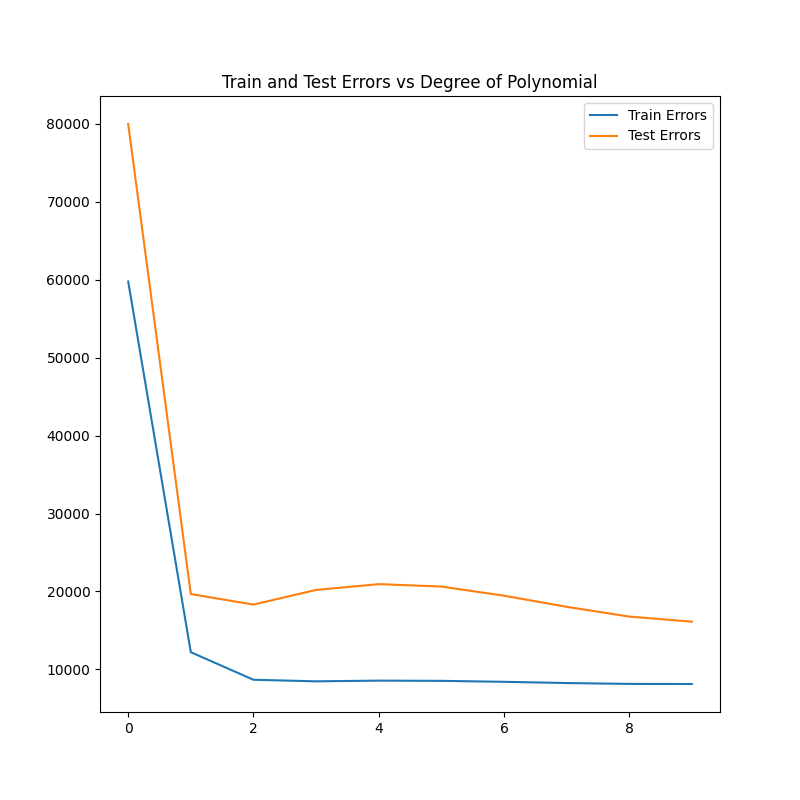

In [50]:
plt.figure(figsize=(8,8))
plt.plot(train_errors5 , label = "Train Errors")
plt.plot(test_errors5 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

In [51]:
all_theta

[array([], dtype=float64),
 array([ 37.57407548, 284.90897952]),
 array([-45.79807776,  67.13809345, 191.72438814,  95.35673771,
         24.6385518 ]),
 array([-18.18465501,  52.50587934,  91.53864557,  34.65093641,
          1.44660932,  99.68582323,  54.70017476,  18.51690615,
          4.50998325]),
 array([-2.97118074, 59.90913057, 76.38116963, 30.77533234,  7.10310744,
        65.13179427, 32.75356906, 11.36152631,  5.75829499, 41.80157632,
        18.03183387,  1.02639061, -4.32602376, -0.38874776]),
 array([ -6.22961607,  61.94077901,  77.02614745,  33.01516506,
          6.4578623 ,  63.77373743,  34.81762572,  14.75909365,
          8.31644791,  37.89140601,  18.93193866,   6.2914026 ,
          2.07043013,   5.13016946,   7.15554465,  -4.24128534,
        -10.49821992, -10.79256914,  -5.39685712,   2.25053316]),
 array([-1.41926935e+01,  6.09366671e+01,  7.85498297e+01,  3.16867251e+01,
         1.84086872e+00,  6.86015951e+01,  3.89626950e+01,  1.53062420e+01,
         5.66

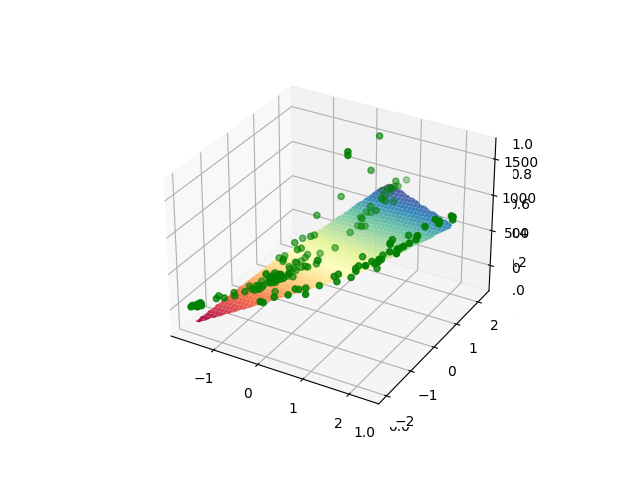

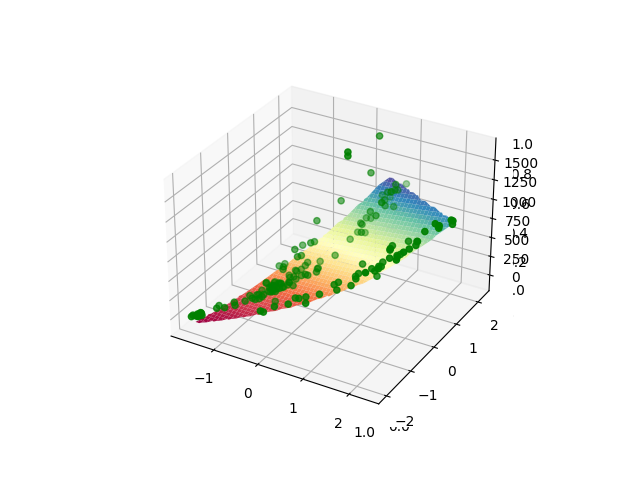

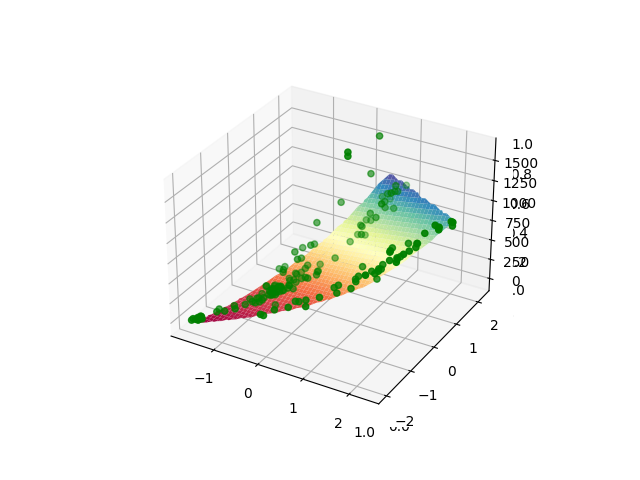

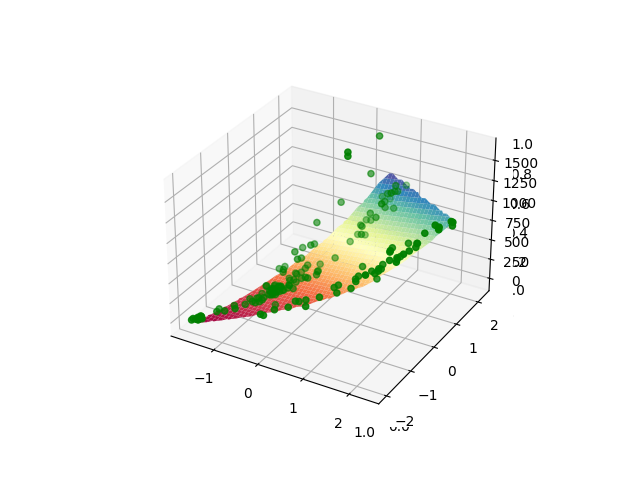

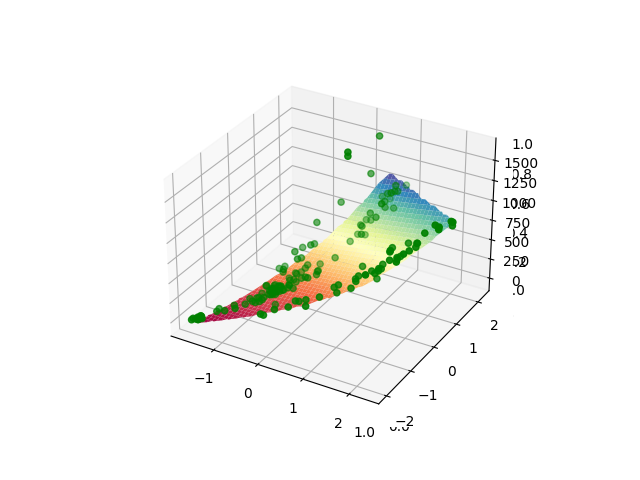

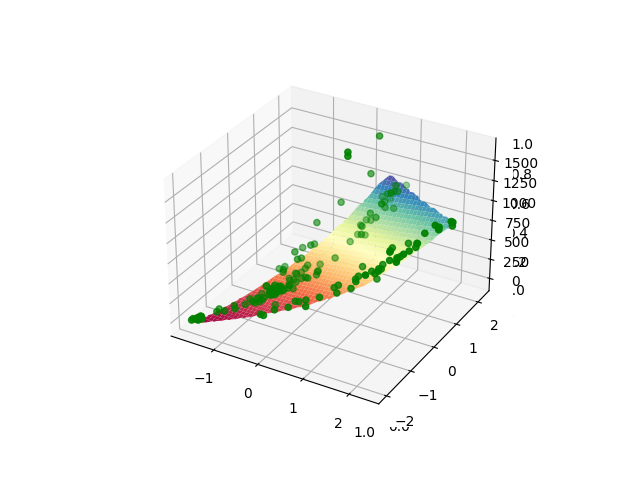

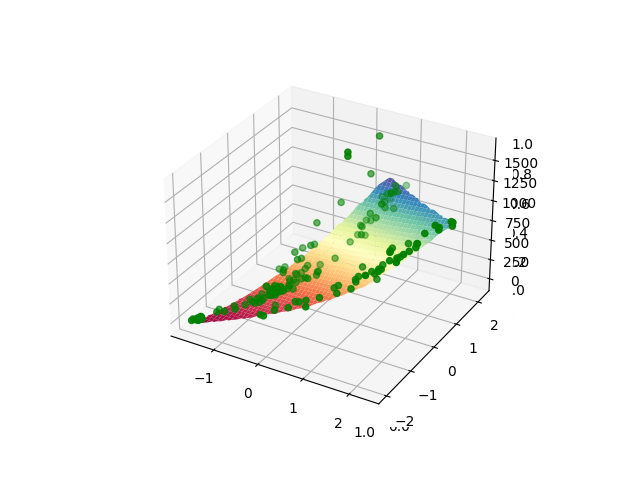

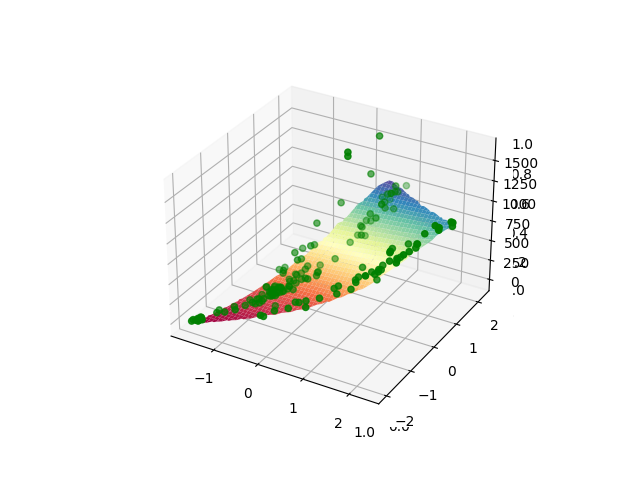

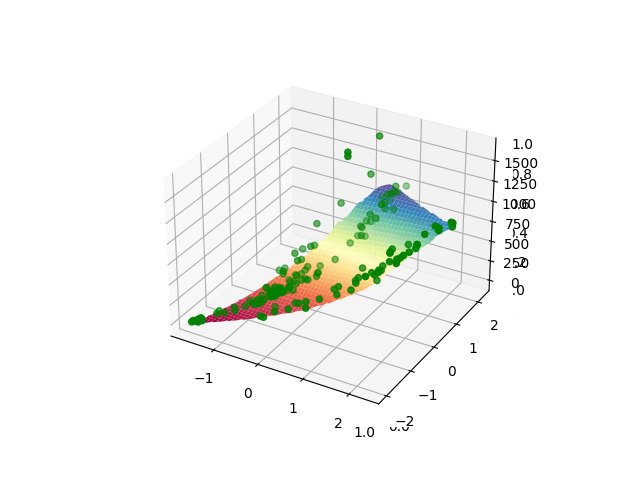

In [52]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Q = 1

Final Estimate of b and theta :  388.7665468627126 [ 37.3654869  284.60118315]
0.7516279073478729


Final Estimate of b and theta :  391.1970583897788 [-46.00311811  67.1062381  190.94446448  95.45492805  24.23860103]
0.7689637715322232


Final Estimate of b and theta :  392.4184542454877 [-18.12785138  51.59398883  91.42908704  35.92127117   0.57221505
  97.91087738  55.60758916  19.31242289   2.71647789]
0.7454544799818921


Final Estimate of b and theta :  392.702212598602 [-3.81451518 58.80133209 75.33538101 33.92263934  6.54740619 63.14287777
 35.4114175  12.5181958   3.32976875 38.19483294 19.67696135  3.16003078
 -4.58288887 -3.58101695]
0.7362906060120881


Final Estimate of b and theta :  392.5922611206642 [-7.45780236 59.96670941 76.03495766 36.08214679  5.40698224 61.9036545
 38.5760871  16.15489514  5.82023314 34.32280568 21.70703817  9.89962274
  2.88224535  2.55151207  1.41503483 -3.40932708 -7.79640648 -8.90626935
 -7.67977034 -2.70687089]
0.7408594698923713


Final Esti

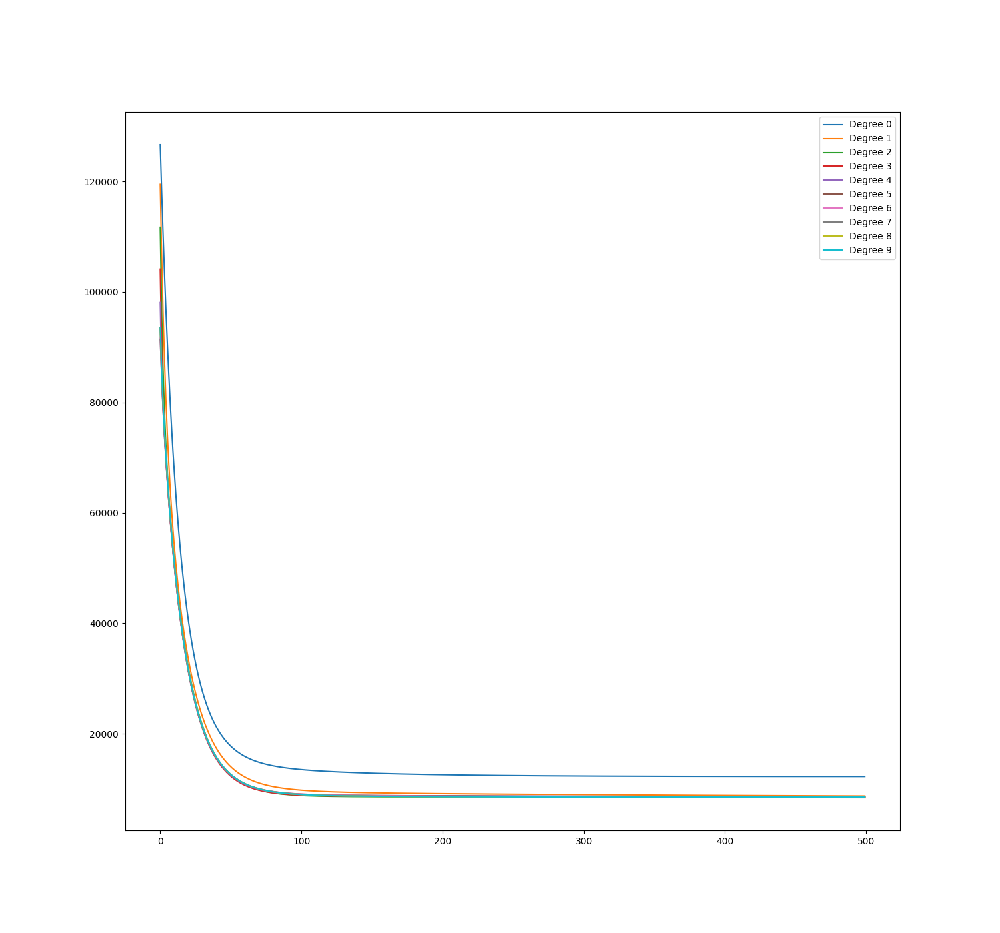

In [53]:

plt.figure(figsize=(15,14))
best_b2 = None
best_theta2 = None
best_r2_score2 = 0
train_errors6 = []
test_errors6 = []
r2_scores = []
costs = []

all_b = []
all_theta = []
Q=1
_lambda=0.5 #Lambda
for i in range(1,11):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)

    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors6.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors6.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score2:
        best_r2_score2 = r2
        best_b2 = b_sgd
        best_theta2 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

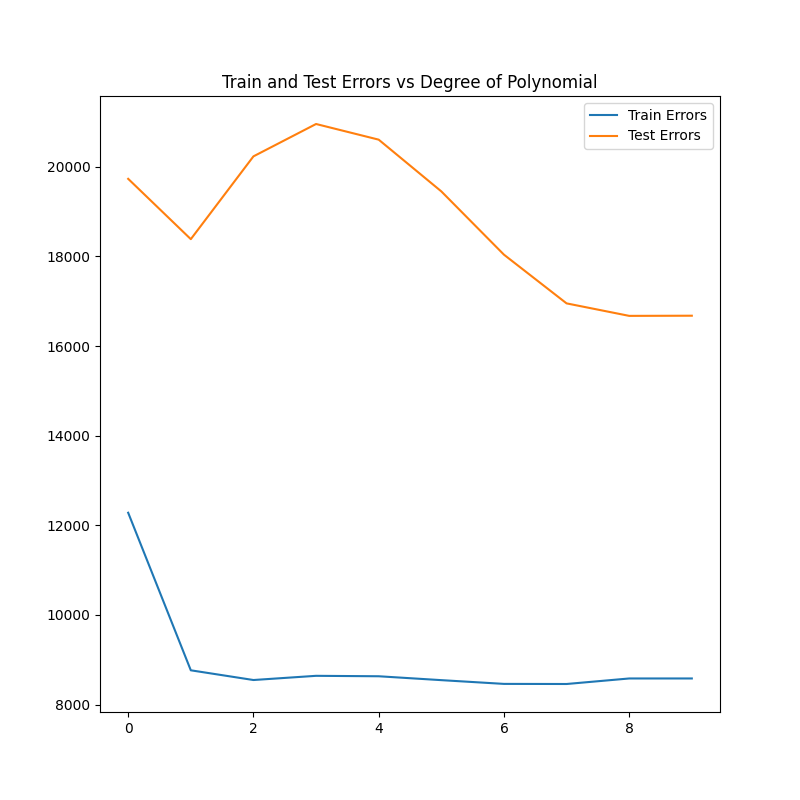

In [54]:
plt.figure(figsize=(8,8))
plt.plot(train_errors6 , label = "Train Errors")
plt.plot(test_errors6 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

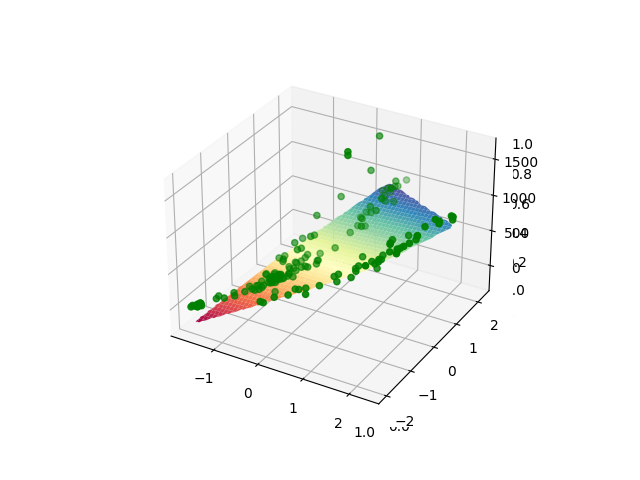

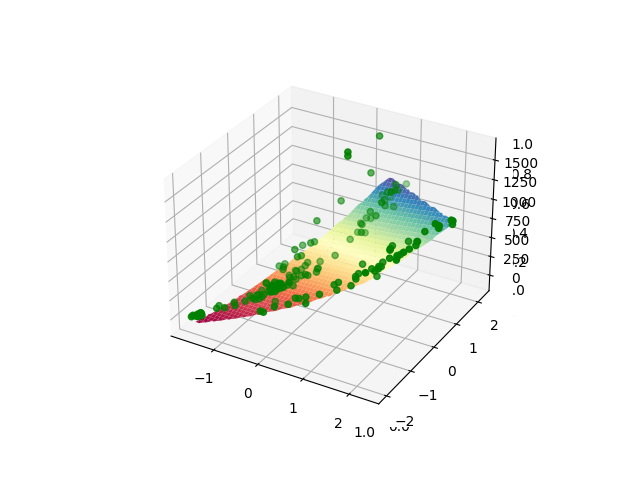

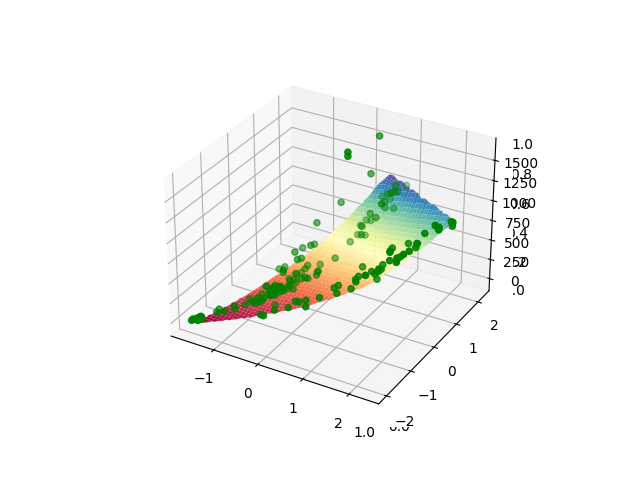

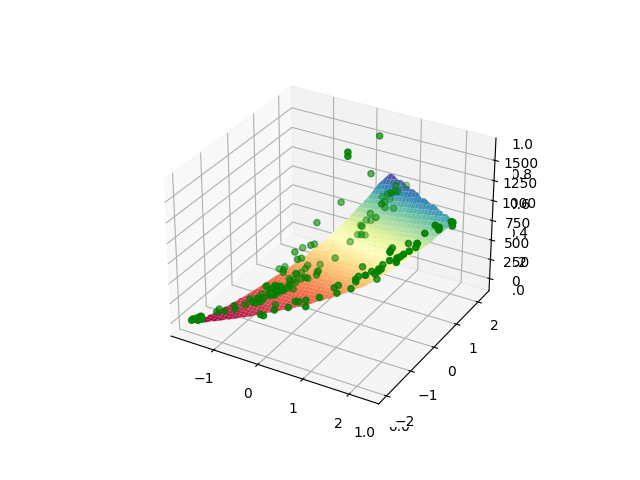

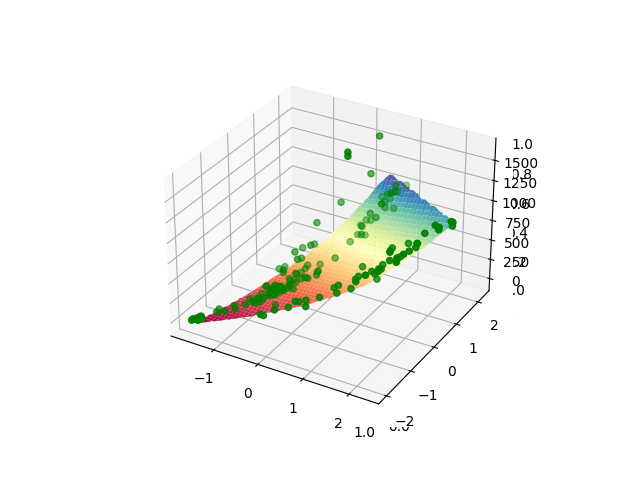

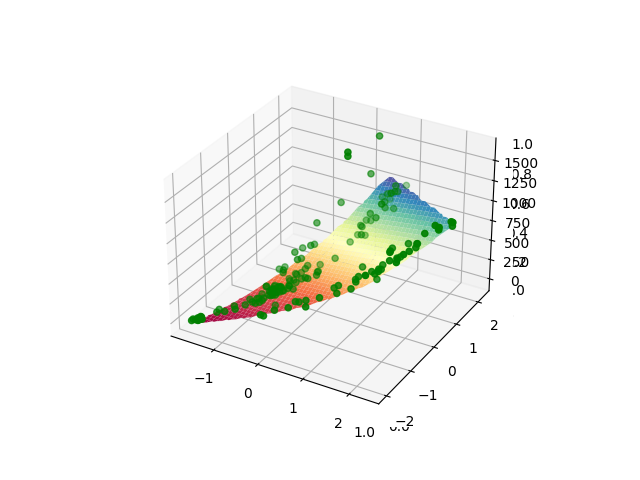

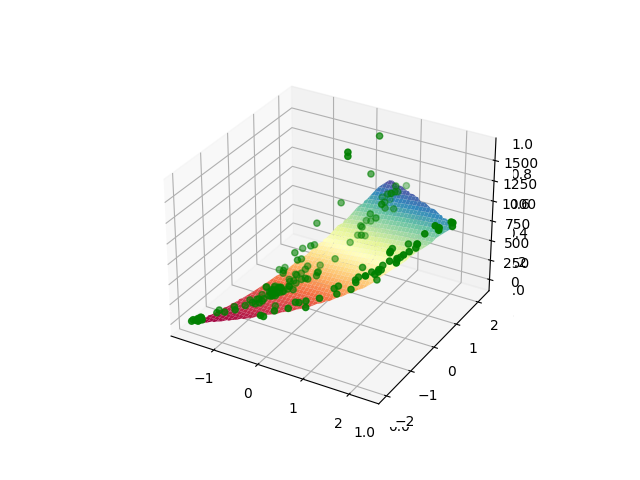

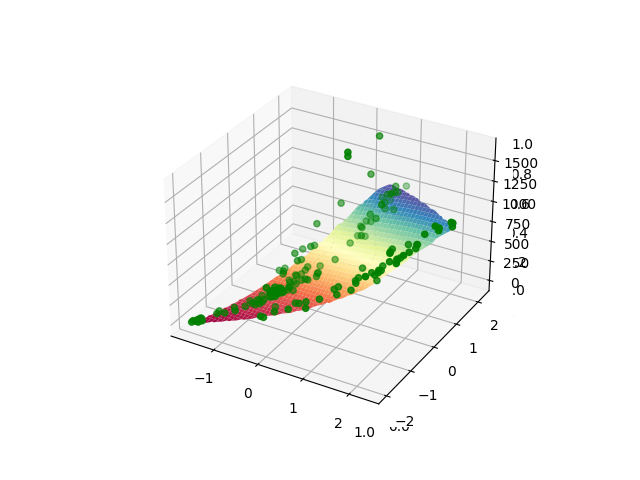

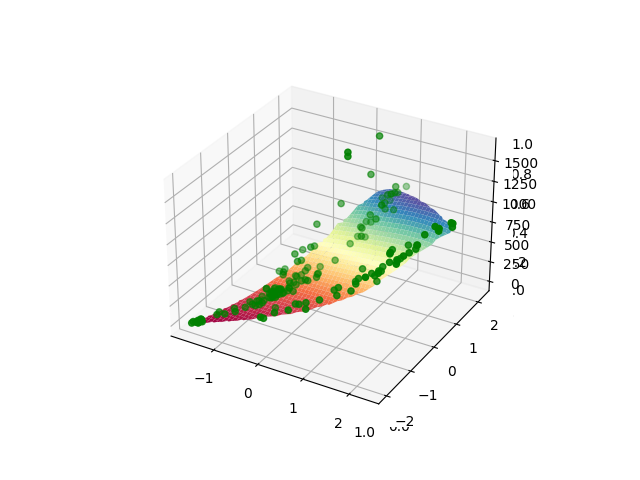

In [55]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Q = 2

Final Estimate of b and theta :  388.7930245459093 [ 36.08742016 282.79803184]
0.751833635628506


Final Estimate of b and theta :  391.21600005165817 [-46.73023852  65.95460488 189.23617012  97.14569397  22.50543122]
0.7693491575992641


Final Estimate of b and theta :  392.4209337468748 [-1.84371849e+01  5.11220632e+01  9.08187323e+01  3.72262607e+01
  9.01228588e-02  9.67423181e+01  5.61161795e+01  1.99159486e+01
  1.27643966e+00]
0.745786916799045


Final Estimate of b and theta :  392.70267870798824 [-3.49304363 58.47860104 75.68336281 33.47305385  6.62281424 63.47420509
 35.43723525 12.54672257  2.90688961 38.1417313  19.06189645  3.41903611
 -3.98317207 -3.8191317 ]
0.7363401508111225


Final Estimate of b and theta :  392.59474172911627 [-7.4205809  60.86519709 76.66905872 34.70501633  6.4274285  62.30834485
 37.40850279 15.27496171  6.64369929 35.55677186 20.99173188  7.97131784
  2.29197402  3.65890472  3.66202953 -3.99586175 -8.87230464 -9.48892339
 -6.71898106 -0.63865271]


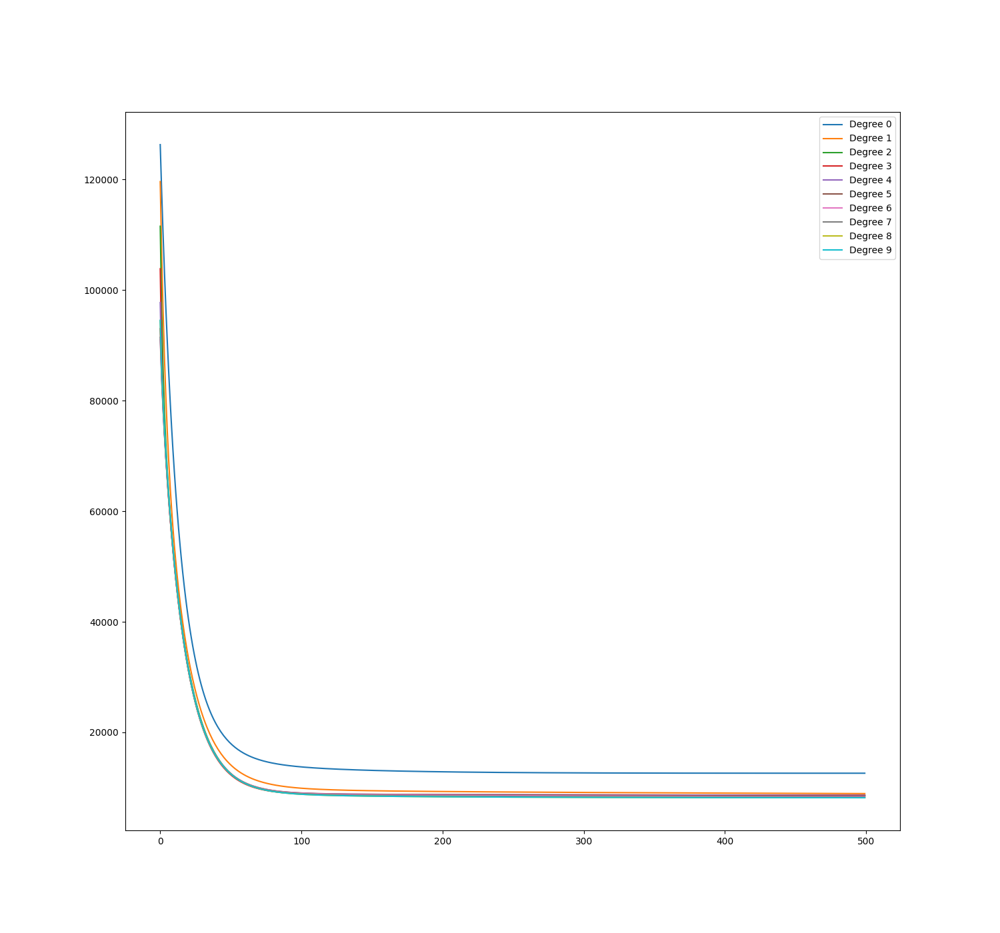

In [56]:
plt.figure(figsize=(15,14))
best_b3 = None
best_theta3 = None
best_r2_score3 = 0
train_errors7 = []
test_errors7 = []
r2_scores = []
costs = []
all_b = []
all_theta = []
Q=2
_lambda=0.01 #Lambda
for i in range(1,11):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)



    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors7.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors7.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score3:
        best_r2_score3 = r2
        best_b3 = b_sgd
        best_theta3 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

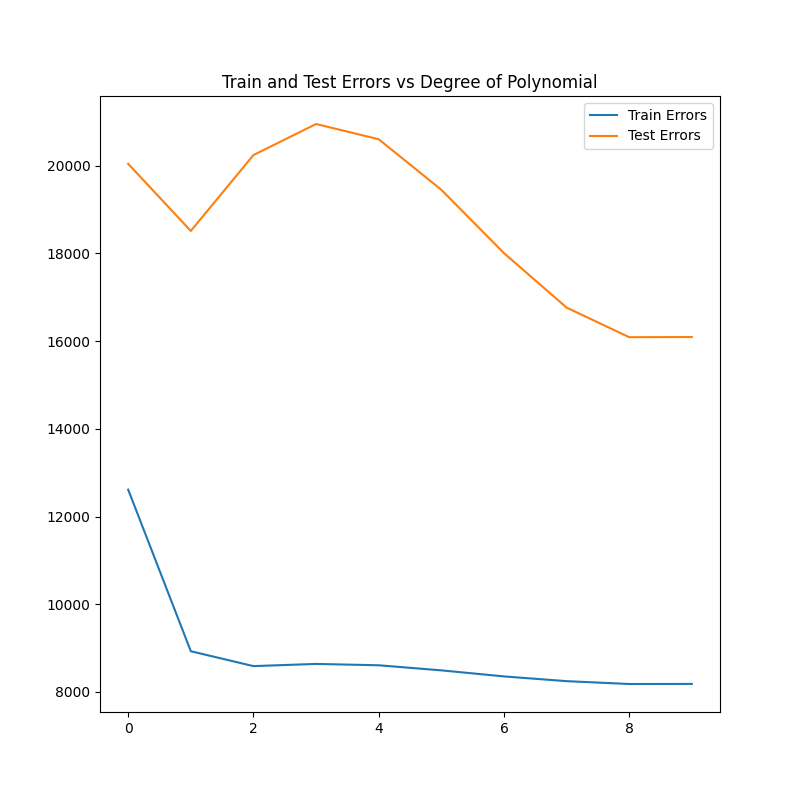

In [57]:
plt.figure(figsize=(8,8))
plt.plot(train_errors7 , label = "Train Errors")
plt.plot(test_errors7 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

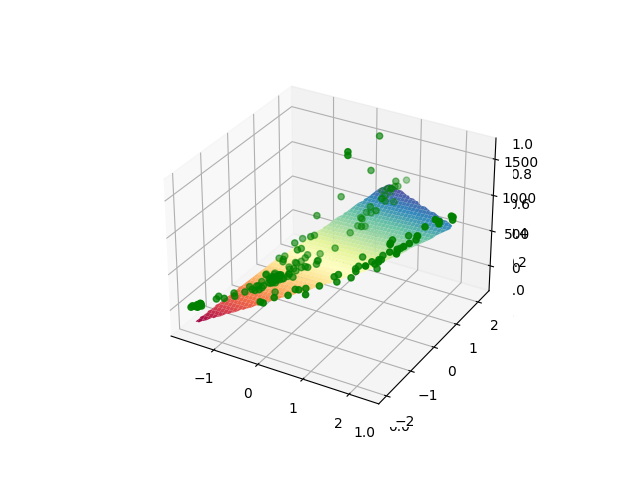

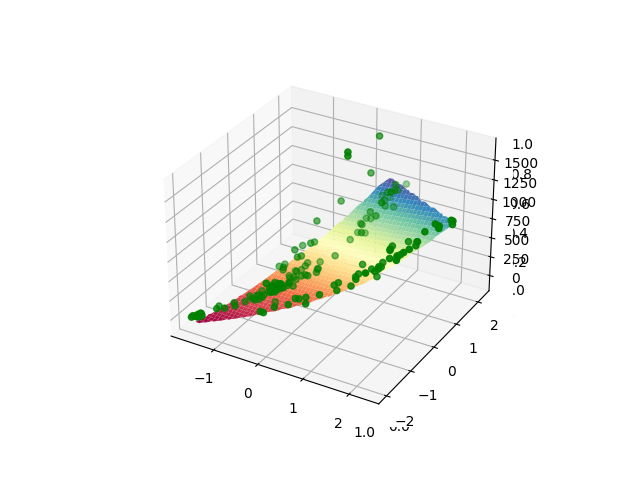

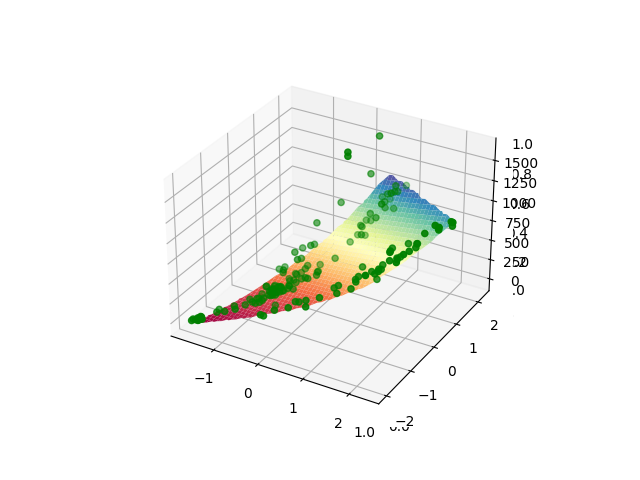

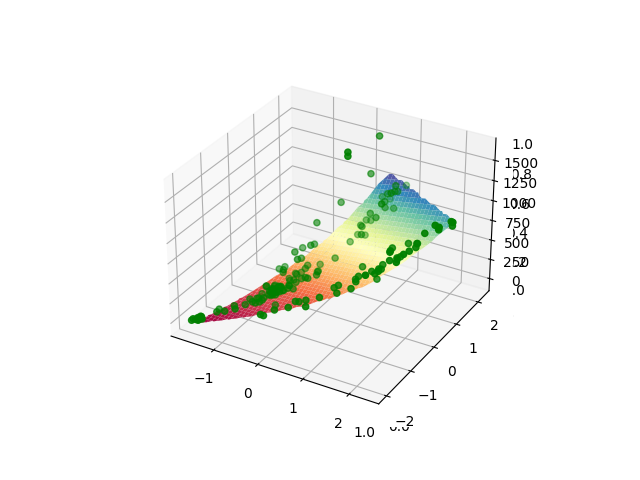

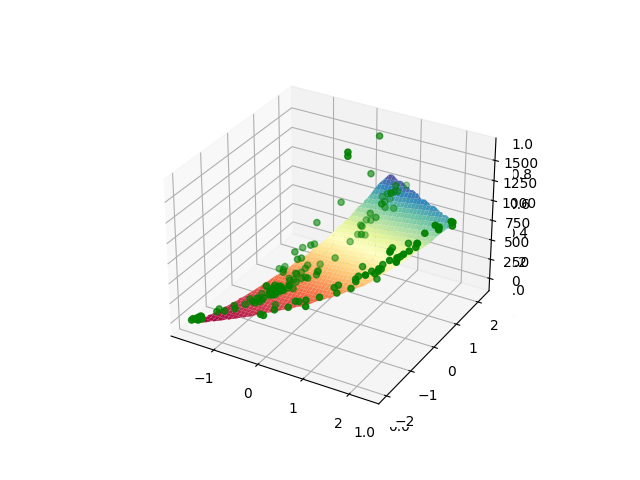

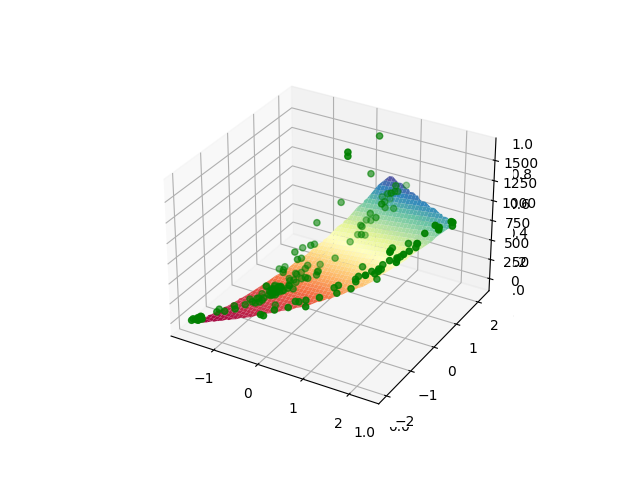

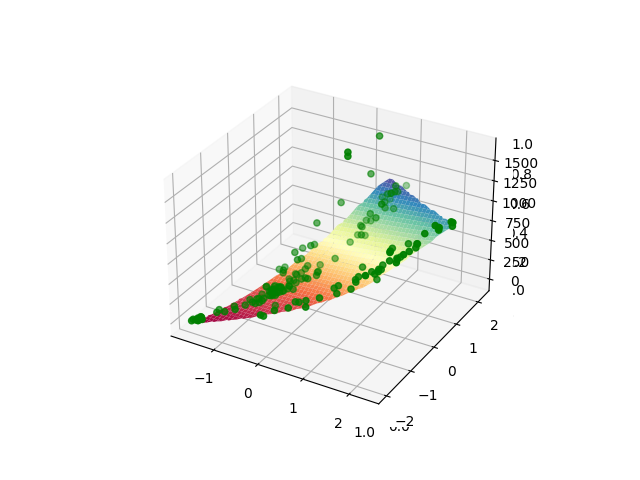

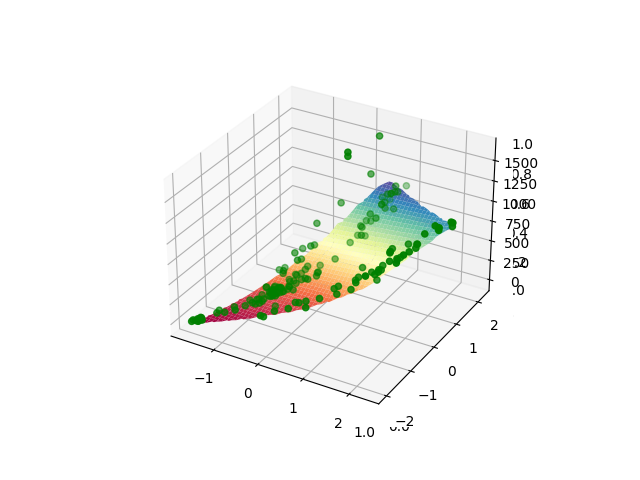

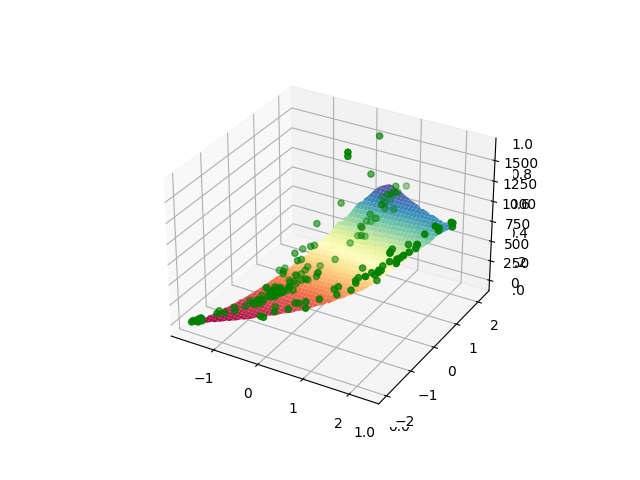

In [58]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Q = 4

Final Estimate of b and theta :  389.11373006694834 [ 20.16794884 261.62816675]
0.7449955688852031


Final Estimate of b and theta :  391.2773180402087 [-48.71472463  62.48490542 183.66282369 100.32481544  17.31154105]
0.7696261342042918


Final Estimate of b and theta :  392.4227726228468 [-18.62073481  51.24908083  90.55484684  36.68906245   0.80152871
  96.93105455  56.05159874  19.93521158   0.92586296]
0.7458618147656273


Final Estimate of b and theta :  392.7081597323044 [-3.04255352 59.49662116 75.95371638 31.20832471  7.26508942 64.88873083
 33.54680254 11.51458751  4.94468326 40.55010308 18.72400355  1.54051051
 -4.30877777 -1.38416169]
0.7359183796032696


Final Estimate of b and theta :  392.60939903608585 [ -6.33384131  62.00857389  77.02557837  32.46991871   7.36637665
  64.35989693  34.62518564  13.79435725   8.28306052  37.93412536
  18.51202178   5.95646291   1.73999109   5.40768297   7.75616144
  -4.53195709 -11.25162112 -10.73208086  -4.71964629   2.55795712]
0.74019

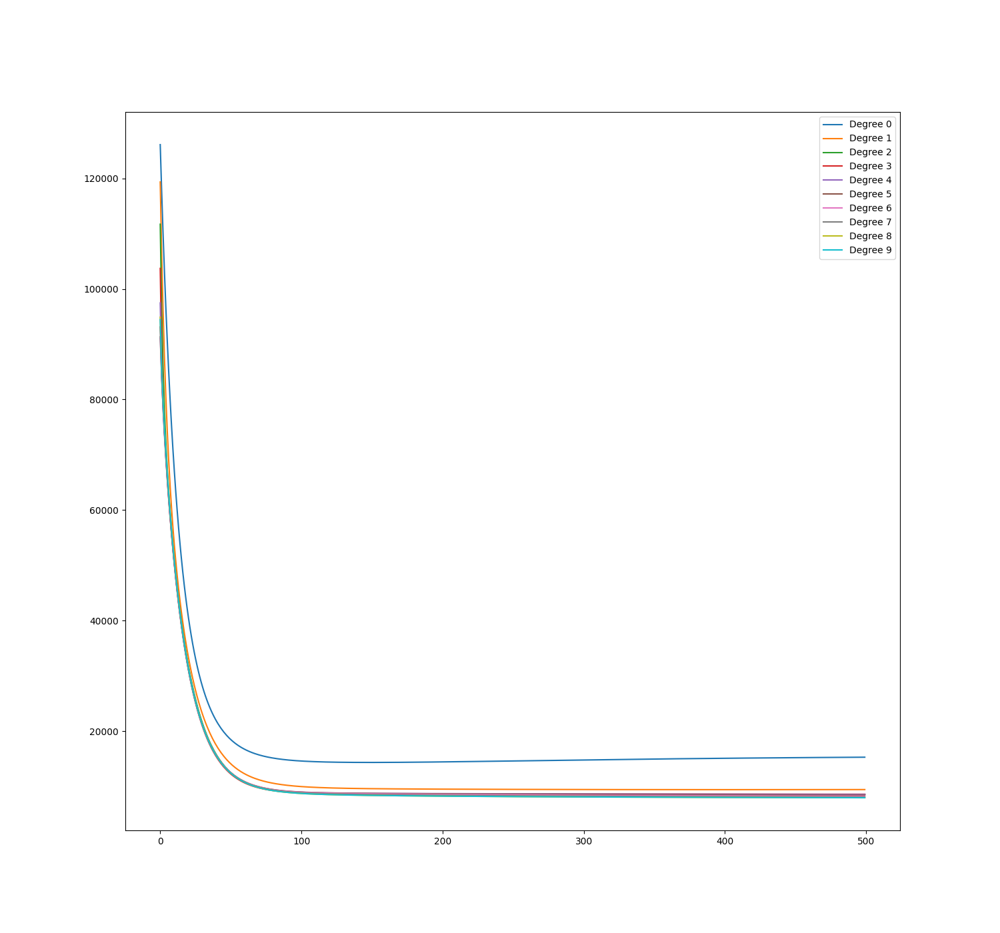

In [59]:
plt.figure(figsize=(15,14))
best_b4 = None
best_theta4 = None
best_r2_score4 = 0
train_errors8 = []
test_errors8 = []
r2_scores = []
costs = []
all_b = []
all_theta = []
Q=4
_lambda=1e-6 #Lambda
for i in range(1,11):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)


    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors8.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors8.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score4:
        best_r2_score4 = r2
        best_b4 = b_sgd
        best_theta4 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))
print(best_r2_score4)

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

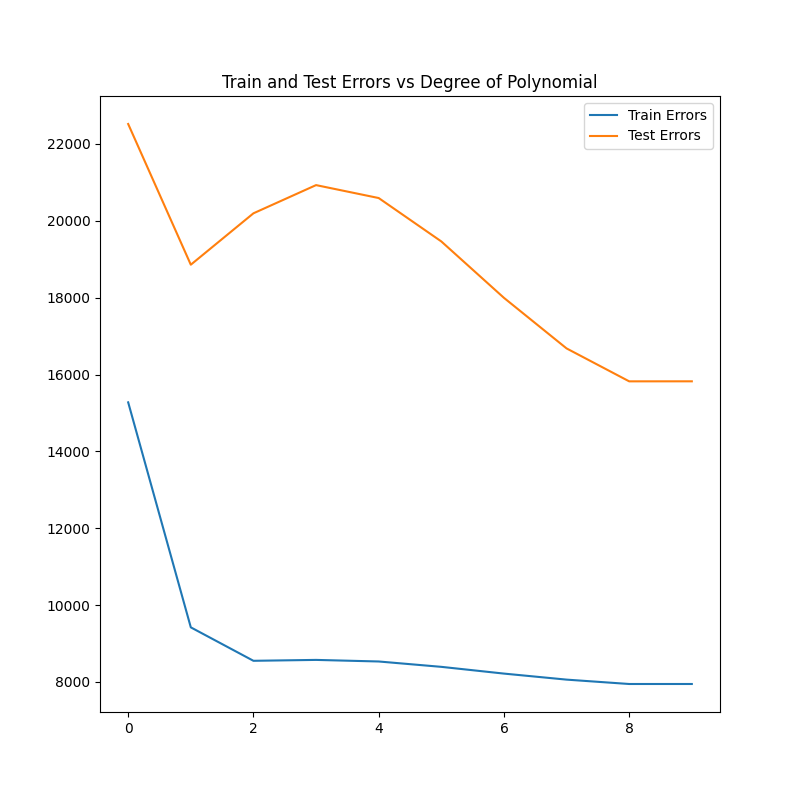

In [60]:
plt.figure(figsize=(8,8))
plt.plot(train_errors8 , label = "Train Errors")
plt.plot(test_errors8 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

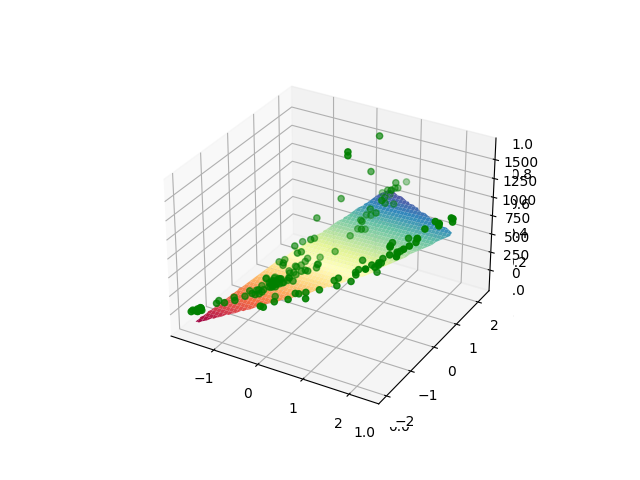

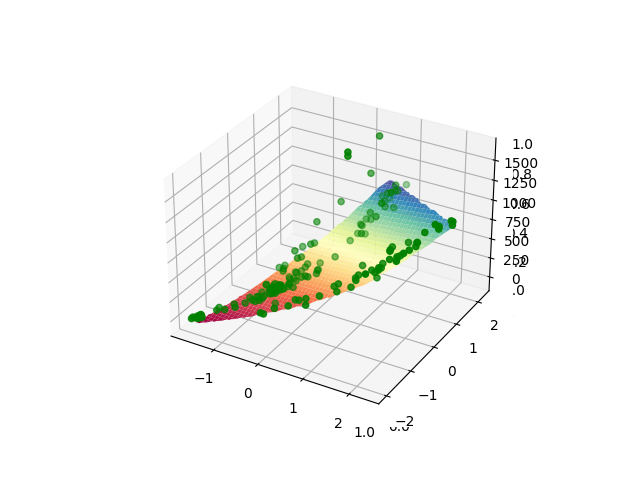

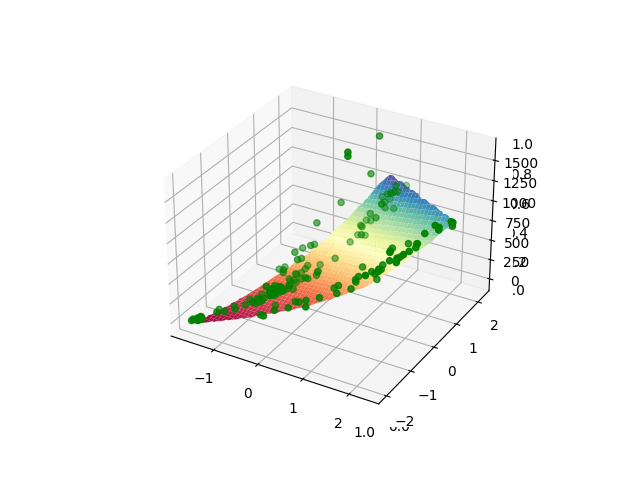

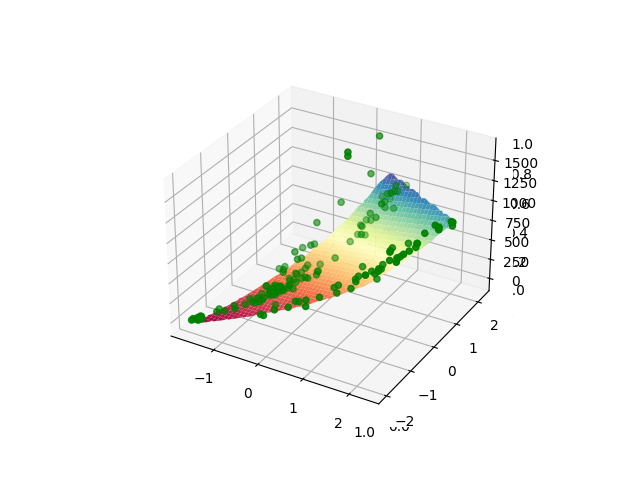

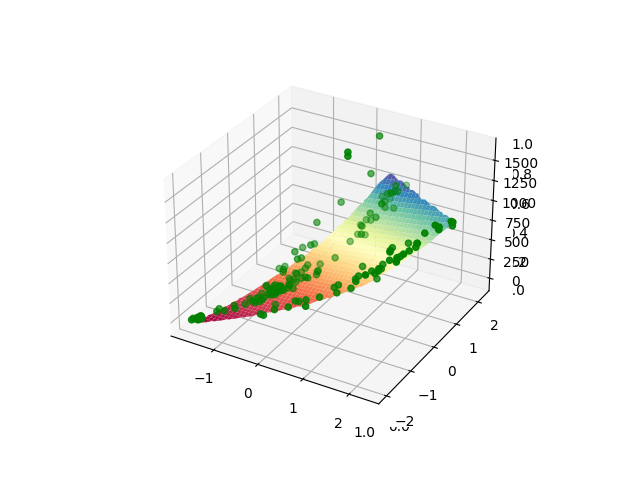

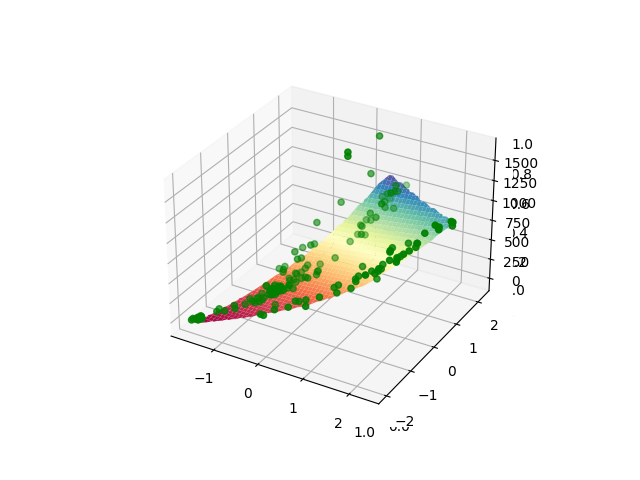

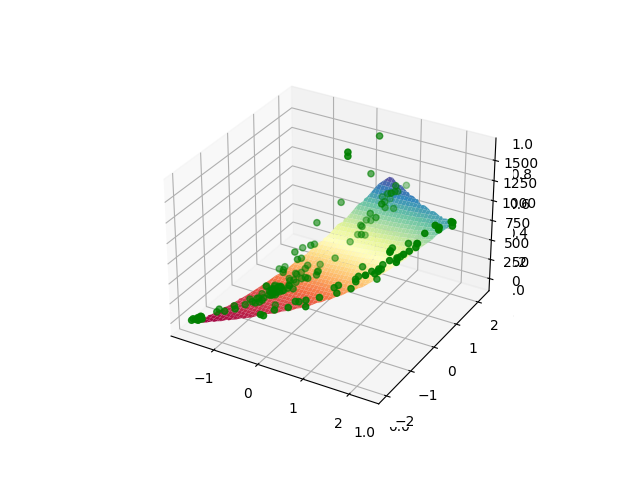

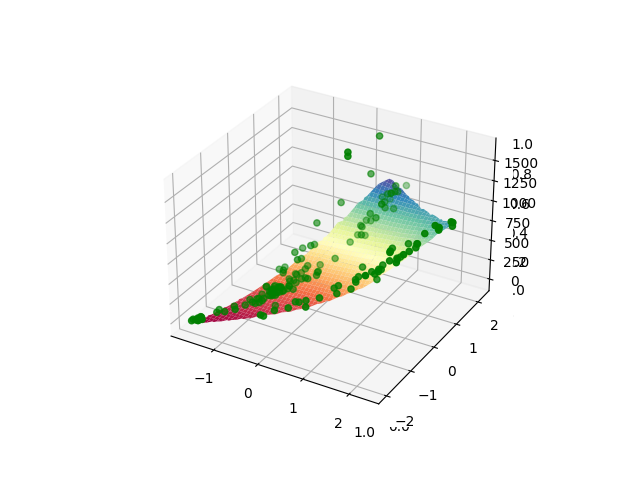

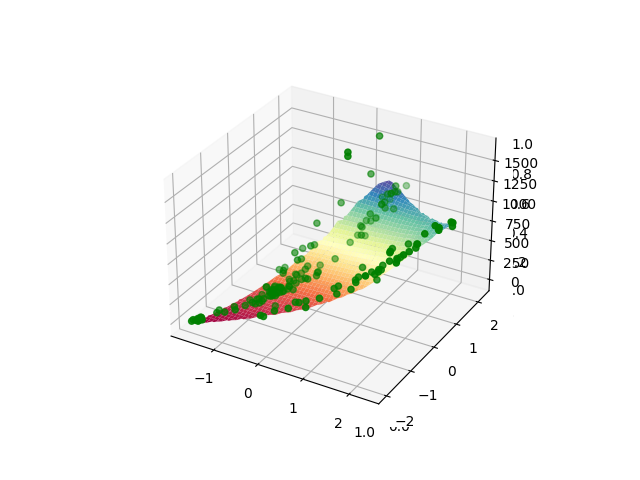

In [61]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

# Comparative Analysis Study:

Here, we will go in further depth of all 4 optimised regression models.

Before that, let us see what the results are, after that we will draw conclusions out of the results.

## Results:

NOTE: The degree is decided based on the highest R2 score.

(R2 score: The R-squared (R2) score, also known as the coefficient of determination, is a statistical measure that assesses a regression model's goodness of fit. It quantifies the fraction of the variance in the dependent variable explained by the model's independent variables. In other words, it assesses how effectively the model's independent variables account for the variability in the dependent variable.)

### For batch gradient descent:

### 1) q = 0.5

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 0.75

### 2) q = 1

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 0.5

### 3) q = 2

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 78%
The learning rate used (determined via hit and trial) is: 0.01

### 4) q = 4

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 1e-6

### For stochastic gradient descent:

### 1) q = 0.5

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 79.75%
The learning rate used (determined via hit and trial) is: 0.9

### 2) q = 1

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 79.8%
The learning rate used (determined via hit and trial) is: 0.5

### 3) q = 2

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 0.01

### 4) q = 4

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 80%
The learning rate used (determined via hit and trial) is: 1e-6


We are not showing coefficients as it is already provided above, and hence redundant.

## Observations:

1) We notice that, as we increase the power of weights (i.e. 0.5 -> 1 -> 2 -> 4), values of our learning rates are decreasing.

    One possible explanation is that, since sum of w^q increase, we need as decreasingly smaller values of lambda, so as to compensate for our higher sum of w^q.

2) We also notice that, as we increase the power of weights (i.e. 0.5 -> 1 -> 2 -> 4), degree of our model is also decreasing.

    A possible explanation for this phenomenon is that, as q increase, the focus on regularisation term increases and get a lower degree due to higher regularisation.

3) Regarding overfitting: Since number of data points are very low (159), a huge possibility of overfitting arises. To combat this we can do two things:

    3.1) This can be reduced by using large number of data points which unfortunately are not available.
    
    3.2) We can use regularisation.

        3.2.1) As we can see, at lower degree, even the training error is very high due to underfitting rendering the model useless.

        3.2.2) After certain degree, the training error remains similar, but test error keeps decreasing. The fact that the test error is decreasing certainly means that there is NO OVERFITTING, because of the regularisation applied.

        3.2.3) There are a few exceptions to this trend, where we see overfitting at some lower degrees ( 4 or 5), but this might be the result of lesser data or some specific shuffling.
        
    3.3) PS: The exact values of test error and training might slightly differ for different q and different gradient descent algorithms, but the general picture, which is similar for all is described here.